## title: "Shifting paradigms in Ocean Color: Bayesian Inference for Uncertainty-Aware Chlorophyll Estimation "

@author: Erdem Karaköylü<br>
@date: "2025-04-03"

### Introduction

Satellite ocean color remote sensing has long served as a cornerstone of marine ecosystem monitoring, offering global and synoptic coverage of surface ocean properties. Among these, chlorophyll-a ($Chl_a$) concentration remains a central metric, widely used as a proxy for phytoplankton biomass, primary production, and water quality. The retrieval of $Chl_a$ from ocean color data has evolved over decades, resulting in a diverse lineage of empirical and semi-empirical algorithms. 

Regrettably, the development of traditional ocean color algorithms is grounded in a fundamental statistical error—one that pervades much of observational science: the conflation of sampling probability with inferential probability [@jaynes2003probability; @DeScheemaekere2011].

Consider a dataset $D$ composed of input–output pairs—e.g., remote sensing reflectance (Rrs) and chlorophyll-a concentration ($Chl_a$)—and a model $M$, such as OCx, posited to represent the relationship between them. The sampling probability $p(D \mid M)$ denotes the probability of observing data $D$ under the assumption that model $M$ is true. In standard model fitting, this likelihood is maximized by adjusting the parameters of $M$ to best explain the observed data.

This approach tacitly assumes that the model which best fits the data also most accurately represents the underlying generative process. This constitutes an epistemic fallacy—treating $p(D \mid M)$ as if it were $p(M \mid D)$—a direct violation of Bayes’ theorem and the rules governing conditional probability.

Although in well-behaved, data-rich cases—where the likelihood is regular, the signal strong, and the model adequately constrained—the maxima of $p(D \mid M)$ and $p(M \mid D)$ may coincide, this remains the exception—not the rule.

This mistake lies at the heart of what Clayton [@clayton2022bernoulli] terms the Bernoulli Fallacy: the widespread misinterpretation of likelihood as inference, or of data-fit as belief. As Clayton argues, this logical misstep has far-reaching consequences, with implications that extend beyond science to domains such as medicine, law, and public policy.

In scientific modeling, this fallacy contributes to poor generalization, drives the use of ad hoc or retrospective uncertainty quantification, and underlies many published results that later prove difficult to replicate [@baker2016; @cobey2024biomedical]. These limitations are not restricted to classical hypothesis testing; they persist in the training and deployment of modern machine learning models as well.

In regression and classification, maximizing likelihood is often treated as sufficient for inference—despite yielding only a single point estimate and ignoring both parameter uncertainty and the plausibility of alternative models.

This epistemic shortcut has been directly critiqued in the machine learning literature. Gal [@gal2016uncertainty] and Ghahramani [@gahramani2015probabilistic] point out that most ML models discard uncertainty altogether, treating the outcome of an optimization as if it were an inference. The result is overconfident predictions and brittle generalization—concerns that echo Clayton’s critique.

Bishop [@bishop2006pattern] similarly distinguishes between the utility of predictive models and the inferential scaffolding required to quantify uncertainty, reinforcing the notion that likelihood alone is insufficient—and that the Bernoulli Fallacy permeates much of applied machine learning.


1. We demonstrate how to recast  one of the $OCx$ formulations, $OC6$ (O'Reilly et al. 2019), as a  **Bayesian polynomial regression model**. 
2.  **A Bayesian hierarchical partial pooling linear regression model**  inspired by Gordon & O'Reilly's  (1983), and stcutured to avoid issues related to discontinuities cauxed by switching between band ratios, cautioned against by Gordon & O'Reilly (1983), O'Reilly et al. (1998), and others. The principal advantages of partial pooling model is the maximization of the use of the information contained in the dataset, and shrinkage of predictive uncertainty. The linear formulation is also more readily interpretable conmpared to polynomial models like $OC6$.  
3. **Bayesian Additive Regression Trees** (BART, [@chipman2010bart]) as a robust flexible method that has been used for diverse applications ([@linero2017, @hill2020].) The main advantage of this approach is that multicollinearity between features is not an obstacle to good model fit, contrary to linear regression, neural networks, etc. 

In [10]:
from pathlib import Path

import pandas as pd
import numpy as np

import pymc as pm
import pymc_bart as pb

import arviz as az
import matplotlib.pyplot as pp

Here I only use complete rows. Rows with any 'NaN' entry are dropped for the training data set. An out-of-sample tier lacking any chlorophyll is loaded into a different dataframe, and saved for model inspection, later. 

In [11]:
az.style.use('arviz-darkgrid')

## Load data

### Data cleaning and transforming procedures:

* Data comes from the NOMAD v2. (2008) dataset
* Rrs signals equal to 0 were assigned NaN,
* No nulls are passed to the model,
* MBR column was pre-computed with:
    * Max of Rrs411, 443, 489 and 510 set as the numerator,
    * Rrs555 + Rrs679 set as the denominator
* A new column, MBR_flag, indicating the band  occupying the numerator in each observation was created
* log10(MBR) was precomputed as input feature
* Chlorophyll from fluorescence and HPLC were merged,
* A column flagging measurement as fluorescence or HPLC was created for modeling purposed,
* log10(chl) was precomputed as modeling target.

In [ ]:
project_path = Path.cwd()
data_path = project_path / 'data' / '04_transformed'
df = pd.read_parquet(data_path / 'df_all.pqt')
df.info()

In [14]:
df_training = df.dropna()
df_out_of_sample = df.loc[df.chl.isna()] # but no labels available

In [15]:
df_training.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1082 entries, 0 to 1212
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 1082 non-null   int64  
 1   lat                1082 non-null   float64
 2   lon                1082 non-null   float64
 3   etopo2             1082 non-null   float64
 4   oisst              1082 non-null   float64
 5   Rrs411             1082 non-null   float64
 6   Rrs443             1082 non-null   float64
 7   Rrs489             1082 non-null   float64
 8   Rrs510             1082 non-null   float64
 9   Rrs555             1082 non-null   float64
 10  Rrs670             1082 non-null   float64
 11  MBR                1082 non-null   float64
 12  log_MBR            1082 non-null   float64
 13  MBR_flag           1082 non-null   object 
 14  chl                1082 non-null   float64
 15  max_band_all_flag  1082 non-null   object 
 16  log_chl            1082 non-n

In [ ]:
# This is data that does not have any target (chlorophyll data available for)
df_out_of_sample.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95 entries, 9 to 1184
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 95 non-null     int64  
 1   lat                95 non-null     float64
 2   lon                95 non-null     float64
 3   etopo2             95 non-null     float64
 4   oisst              95 non-null     float64
 5   Rrs411             95 non-null     float64
 6   Rrs443             95 non-null     float64
 7   Rrs489             95 non-null     float64
 8   Rrs510             95 non-null     float64
 9   Rrs555             95 non-null     float64
 10  Rrs670             95 non-null     float64
 11  MBR                95 non-null     float64
 12  log_MBR            95 non-null     float64
 13  MBR_flag           95 non-null     object 
 14  chl                0 non-null      float64
 15  max_band_all_flag  95 non-null     object 
 16  log_chl            0 non-null  

In [ ]:
# Create coordinates for modeling with PyMC
mbr_type_idx, mbr_type = df_training.MBR_flag.factorize(sort=True)
chl_type_idx, chl_type = df_training.hplc_flag.factorize(sort=True)
COORDS = {
    'MBR_numerator': mbr_type,
    'chl_type': chl_type,
    'obs_idx': df_training.index
}

## Modeling

### Model 1: Bayesian Modified OC6
Here the model is almost similar to that proposed by O'Reilly et al (2019) in that the main polynomial term, X, an max Band Ratio (MBR) expression has for denominator just the sum of the green (555nm) and red (670nm) reflectances (Rrs) rather than the mean because I don't expect dividing this term further by 2 (to get the mean) will make a difference in the overall model fit. 

Note that for this and subsequent models the *Gamma* distribution is used as a prior for the group-specific dispersion parameter terms $\sigma_i$ due to its support on positive real values $(0, \infty)$ and its flexibility in shaping both low- and high-variance regimes. Unlike the commonly used HalfNormal or Exponential priors, the Gamma distribution allows control over both the mean and dispersion of $\sigma_i$ via its shape ($\sigma_\gamma$) and rate ($\sigma_\phi$) parameters. This is particularly useful when modeling biological or environmental data where dispersion parameter may vary substantially across groups but must remain strictly positive.

In [208]:
X = df_training.log_MBR
y = df_training.log_chl
with pm.Model(coords=COORDS) as bayes_oc6:
    α = pm.Normal('α', mu=0, sigma=1) # intercept
    β1 = pm.Normal('β1', mu=0, sigma=1) # slope for X
    β2 = pm.Normal('β2', mu=0, sigma=1) # slope for X^2
    β3 = pm.Normal('β3', mu=0, sigma=1) # slope for X^3
    β4 = pm.Normal('β4', mu=0, sigma=1) # slope for X^4
    μ = α + β1 * X + β2 * (X**2) + β3 * (X**3) + β4 * (X**4)
    σ = pm.Exponential('σ', 1)
    likelihood = pm.TruncatedNormal(
        'likelihood', mu=μ, sigma=σ, lower=-3, upper=3.3, observed=y, dims='obs_idx')


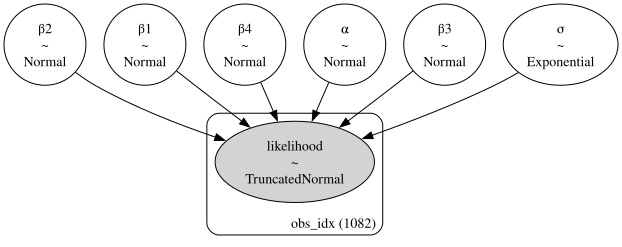

In [209]:
bayes_oc6.to_graphviz()

In [210]:
with bayes_oc6:
    idata_oc6 = pm.sample_prior_predictive()

Sampling: [likelihood, α, β1, β2, β3, β4, σ]


array([<Axes: xlabel='likelihood'>], dtype=object)

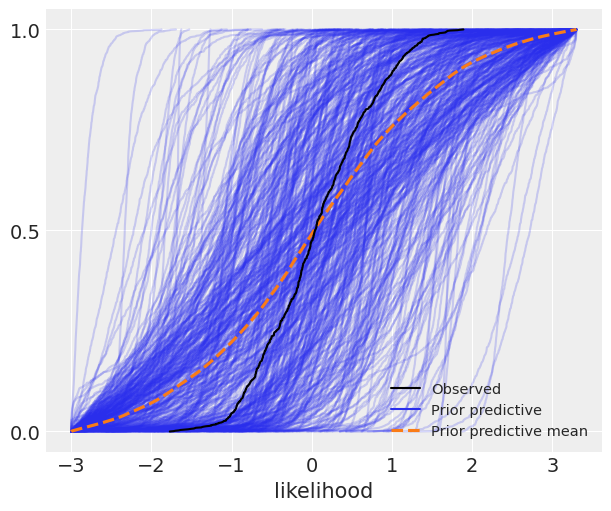

In [211]:
f, ax = pp.subplots(figsize=(6,5))
az.plot_ppc(idata_oc6, kind= 'cumulative', group='prior', ax=ax, observed=True, )

In [212]:
with bayes_oc6:
    idata_oc6.extend(pm.sample(2000, chains=4))
    

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β1, β2, β3, β4, σ]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 17 seconds.


/var/folders/c9/p_x94m2j357984db558g2n9m0000gn/T/ipykernel_67001/2668462343.py:3: UserWarning: The figure layout has changed to tight
  f.tight_layout()


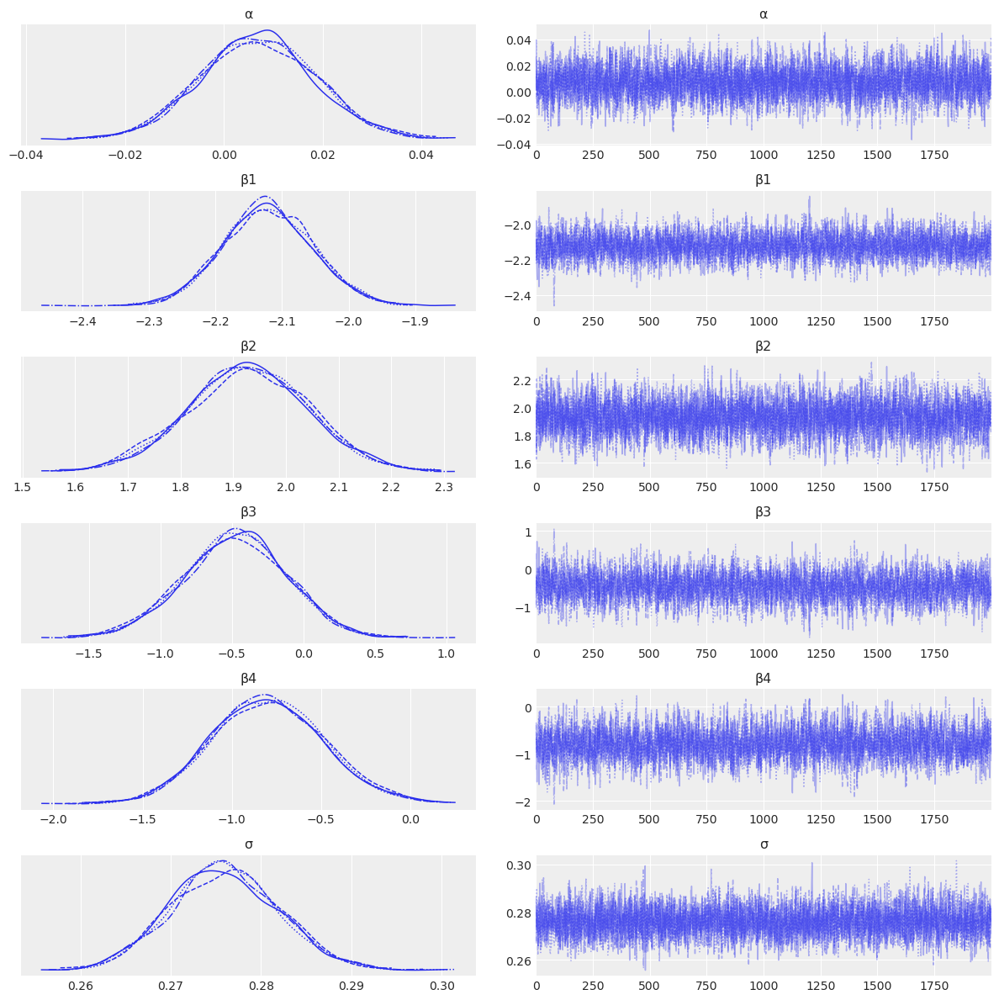

In [213]:
az.plot_trace(idata_oc6);
f = pp.gcf()
f.tight_layout()


In [214]:
with bayes_oc6:
    idata_oc6.extend(pm.sample_posterior_predictive(idata_oc6))

Sampling: [likelihood]


Output()

array([<Axes: xlabel='likelihood'>], dtype=object)

/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


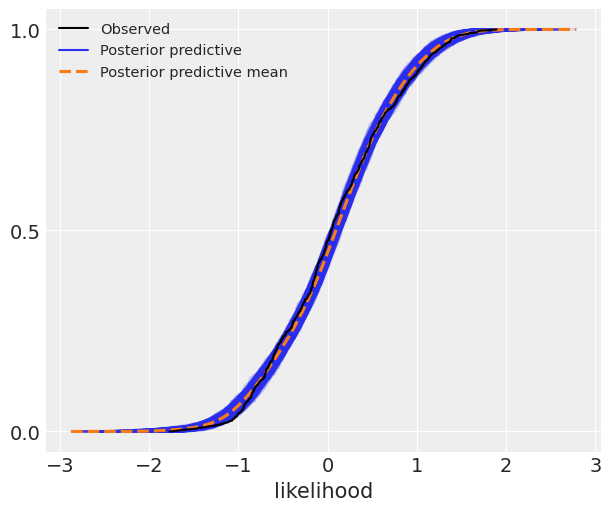

In [215]:
f_postpc, ax = pp.subplots(figsize=(6,5))
az.plot_ppc(idata_oc6, kind='cumulative', group='posterior', ax=ax)

### Model 2 - Bayesian Hierarchical Partially Pooled Linear Max Band Ratio Model, 4 and 6 band groups


Here we start similarly to Gordon et al (1983) but use an approach that circumvents discontinuities reported from switching between blue bands. Thus:
* We compute Max Band Ratio (MBR) as in our Bayesian OC6 model; 
    * the numerator is the maximum of Rrs411, Rrs443, Rrs489, Rrs510,
    * the denomiator is the sum of Rrs555 and Rrs670
    * we track the band used in numerator by adding a "MBR_flag" in our data 
* We segregate the data into 4 groups, each corresponding to the MBR numerator.
* We use a hierarchical partially pooled formulation to:
    * Take advantage of the group structure in the data
    * Maximize the use of the available data (see below)
    * Each group receives its own model slope and intercept parameters
    * These parameters have common hyperpriors (see model graph below)
        * Hyperpriors enabl the sharing of information between groups as the model is being fit
    

#### Explanation - Grouping by Spectral Dominance in Hierarchical Modeling

An expanded version of the grouping approach considers the maximum Rrs value across all key spectral bands—blue, green, and red—to define group membership. This method reflects the dominant optical signal in each observation, which often corresponds to different water types or biogeophysical regimes:

* **Rrs$\_{411}\$-dominant**: Typically associated with ultra-clear, oligotrophic waters. High reflectance at this wavelength implies minimal absorption by both phytoplankton and CDOM, suggesting extremely low pigment concentration and low scattering.
* **Rrs$\_{443}\$-dominant**: Often found in moderately clear Case-1 waters where phytoplankton absorption is just beginning to affect the spectrum. This group may indicate the presence of picoplankton or lightly productive systems.
* **Rrs$\_{489}\$-dominant**: Represents more productive Case-1 waters with moderate phytoplankton biomass. Reflectance here implies a stronger blue signal retained due to a balance of absorption and scattering.
* **Rrs$\_{510}\$-dominant**: Reflects water with increasing influence from particulate scattering, often signaling turbid phytoplankton-rich environments or transitions to Case-2 water.

Using this expanded spectral dominance scheme as a hierarchical grouping variable enables the model to learn distinct relationships between the empirical index and chlorophyll concentration that correspond to different optical regimes. Even if there is overlap in the scatter of individual data points across groups, systematic differences in slope or intercept—common across these spectral classes—justify the use of group-specific structure.

In [ ]:
X = df_training.log_MBR
y = df_training.log_chl
with pm.Model(coords=COORDS) as hl_mbr:
    # Register group index and predictor with obs dimensions
    group_idx = pm.Data(
        'group_idx', mbr_type_idx, dims='obs_idx')
    X_data = pm.Data('X', X.values, dims='obs_idx')
    # ------- Hyper-priors ---------
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.Exponential('α_σ', 1)
    β_μ = pm.Normal('β_μ', 0, 1)
    β_σ = pm.Exponential('β_σ', 1)
    # ------- Priors ---------------
    α = pm.Normal('α', α_μ, α_σ, dims='MBR_numerator')
    β = pm.Normal('β', β_μ, β_σ, dims='MBR_numerator')
    σ = pm.Gamma('σ', 2, 2)

    μ = α[group_idx] + β[group_idx] * X_data
    likelihood = pm.TruncatedNormal(
        'likelihood', mu=μ, sigma=σ, lower=-3, upper=3.2, observed=y, dims='obs_idx')


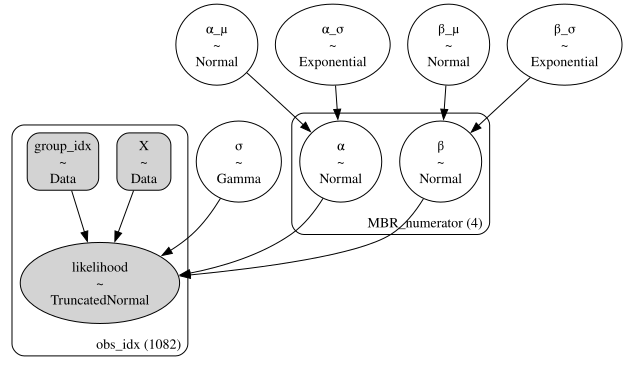

In [128]:
hl_mbr.to_graphviz()

In [129]:
with hl_mbr:
    idata_hlmbr = pm.sample_prior_predictive()

Sampling: [likelihood, α, α_μ, α_σ, β, β_μ, β_σ, σ]


array([<Axes: xlabel='likelihood'>], dtype=object)

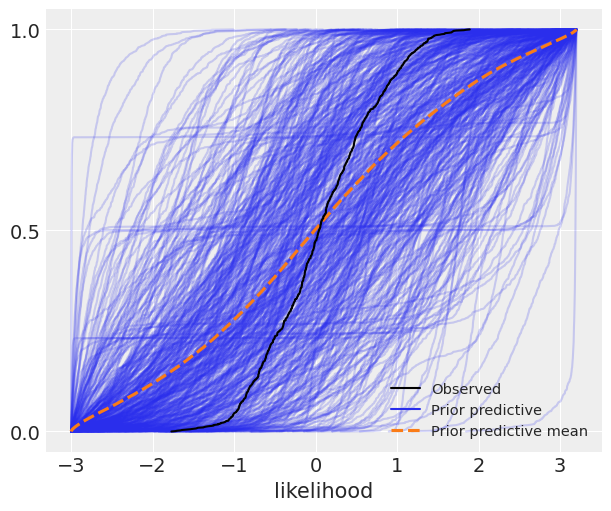

In [130]:
f, ax = pp.subplots(figsize=(6,5))
az.plot_ppc(idata_hlmbr, kind= 'cumulative', group='prior', ax=ax, observed=True)

In [131]:
with hl_mbr:
    idata_hlmbr.extend(pm.sample(2000, chains=4))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 11 seconds.


In [132]:
az.summary(idata_hlmbr).to_clipboard()

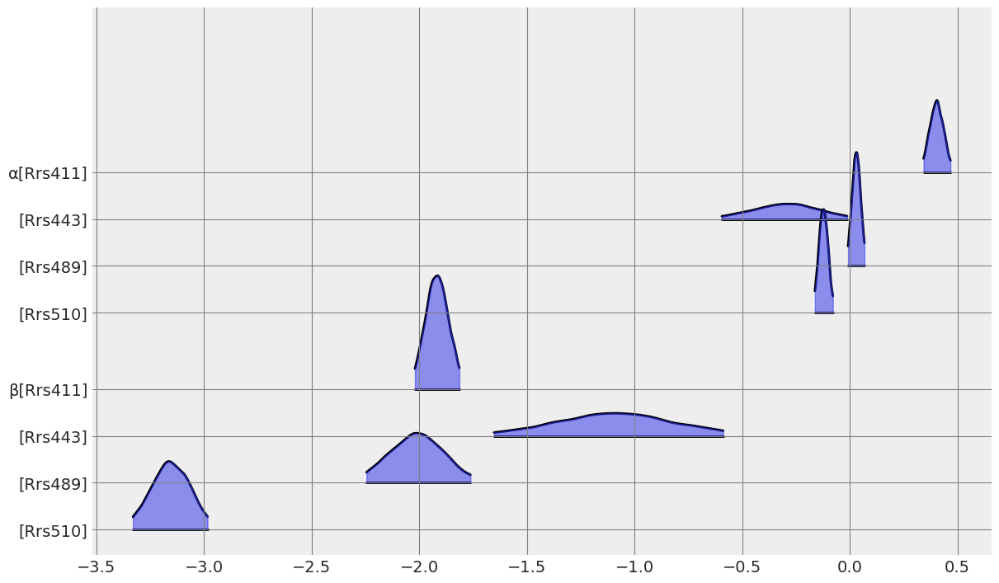

In [133]:
ax = az.plot_forest(
    idata_hlmbr, var_names=['α','β'], kind='ridgeplot', combined=True, 
    textsize=20,
    ridgeplot_alpha=0.5)[0]
ax.grid(color='gray')
f_forest_hlmbr = pp.gcf()
#f_forest_hlmbr.tight_layout()

In [134]:
with hl_mbr:
    idata_hlmbr.extend(pm.sample_posterior_predictive(idata_hlmbr))

Sampling: [likelihood]


Output()

array([<Axes: xlabel='likelihood'>], dtype=object)

/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


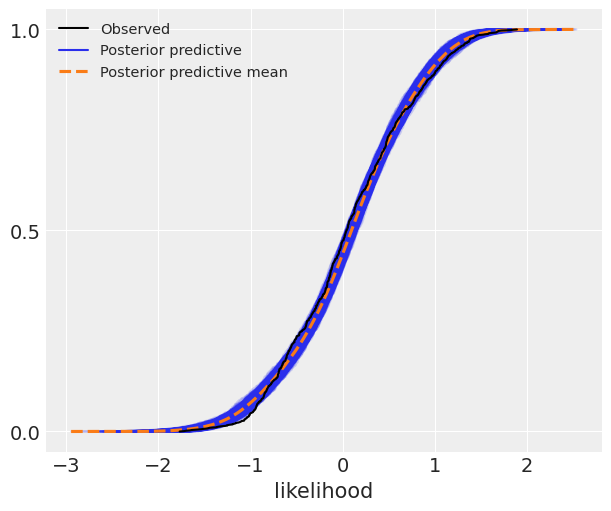

In [135]:
f_hlmbr_postpc, ax = pp.subplots(figsize=(6,5))
az.plot_ppc(idata_hlmbr, kind='cumulative', group='posterior', ax=ax)

/var/folders/c9/p_x94m2j357984db558g2n9m0000gn/T/ipykernel_67001/2798706240.py:45: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


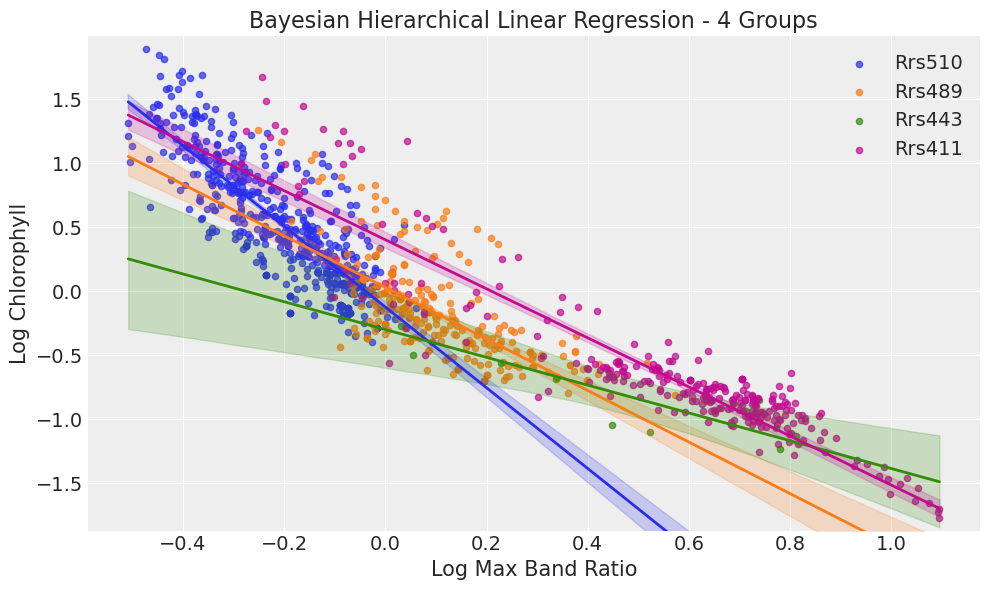

In [ ]:
# Get the unique group names from your data (should match coordinates in idata_hlmbr)
groups = df['MBR_flag'].unique()

# --- Plotting ---

fig, ax = pp.subplots(figsize=(10, 6))

# 1. Scatter Plot of Data Points
for group in groups:
    group_data = df[df['MBR_flag'] == group]
    ax.scatter(
        group_data['log_MBR'],
        group_data['log_chl'],
        label=group,
        alpha=0.7,
        s=20
    )

# 2. Regression Lines with Uncertainty
x_range = np.linspace(df['log_MBR'].min(), df['log_MBR'].max(), 100)

for i, group_name in enumerate(groups):
    # Select posterior samples using the correct coordinate name 'MBR_numerator'
    alpha_posterior = idata_hlmbr.posterior['α'].sel(MBR_numerator=group_name).values.flatten()
    beta_posterior = idata_hlmbr.posterior['β'].sel(MBR_numerator=group_name).values.flatten()

    # Generate regression lines for each sample
    regression_lines = np.outer(beta_posterior, x_range) + alpha_posterior[:, np.newaxis]

    # Plot the mean regression line
    ax.plot(x_range, regression_lines.mean(axis=0), color=f'C{i}', linewidth=2)

    # Plot the uncertainty (e.g., 94% HDI)
    hdi_lower = np.percentile(regression_lines, 3, axis=0)
    hdi_upper = np.percentile(regression_lines, 97, axis=0)
    ax.fill_between(x_range, hdi_lower, hdi_upper, color=f'C{i}', alpha=0.2)

# 3. Labels and Legend
ax.set_ylim(df.log_chl.min()-0.1, df.log_chl.max()+0.1)
ax.set_xlabel('Log Max Band Ratio')
ax.set_ylabel('Log Chlorophyll')
ax.set_title('Bayesian Hierarchical Linear Regression - 4 Groups')
ax.legend()
ax.grid(True)
fig.tight_layout()

/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/arviz/plots/hdiplot.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/arviz/plots/hdiplot.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/arviz/plots/hdiplot.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hd

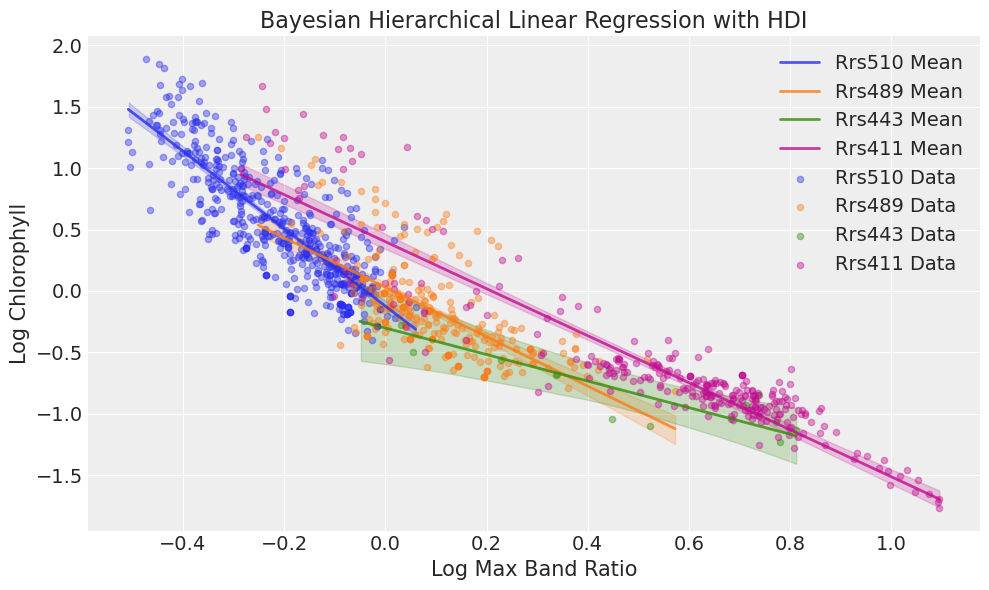

In [120]:
# Define the x-range for the regression lines
x_range = np.linspace(df['log_MBR'].min(), df['log_MBR'].max(), 100)

fig, ax = pp.subplots(figsize=(10, 6))

for i, group_name in enumerate(groups):

    # Get posterior samples for the current group's alpha and beta
    alpha_posterior = idata_hlmbr.posterior['α'].sel(MBR_numerator=group_name).values.flatten()
    beta_posterior = idata_hlmbr.posterior['β'].sel(MBR_numerator=group_name).values.flatten()
    
    x_range = np.linspace(
        df.loc[df.MBR_flag==group_name, 'log_MBR'].min(), 
        df.loc[df.MBR_flag==group_name, 'log_MBR'].max(), 100)
    # Generate regression lines for each posterior sample
    regression_lines = alpha_posterior[:, np.newaxis] + beta_posterior[:, np.newaxis] * x_range

    # Plot the HDI of the regression lines
    az.plot_hdi(x_range, regression_lines, ax=ax, color=f'C{i}', hdi_prob=0.94,  fill_kwargs={'alpha': 0.2})

    # Plot the mean regression line on top
    mean_alpha = alpha_posterior.mean()
    mean_beta = beta_posterior.mean()
    ax.plot(x_range, mean_alpha + mean_beta * x_range, color=f'C{i}', linewidth=2, label=f'{group_name} Mean', alpha=0.8)

# Scatter plot of the original data (optional, but helpful for context)
for group in groups:
    group_data = df[df['MBR_flag'] == group]
    ax.scatter(
        group_data['log_MBR'],
        group_data['log_chl'],
        label=f'{group} Data',
        alpha=0.4,
        s=20
    )

# Labels and Legend
ax.set_xlabel('Log Max Band Ratio')
ax.set_ylabel('Log Chlorophyll')
ax.set_title('Bayesian Hierarchical Linear Regression with HDI')
ax.legend()
ax.grid(True)
fig.tight_layout()

### Model 3 - Extending the grouping to all bands:

#### Grouping by Spectral Dominance in Hierarchical Modeling

An expanded version of the grouping approach considers the maximum Rrs value across all key spectral bands—blue, green, and red—to define group membership. This method reflects the dominant optical signal in each observation, which often corresponds to different water types or biogeophysical regimes:

*  $Rrs555$ - **dominant**: Green-dominant spectra are typically found in high biomass or sediment-rich waters. This group often indicates substantial backscatter, either from large phytoplankton or inorganic particles.
* $Rrs670$ - **dominant**: Extremely rare but potentially indicative of intense algal blooms or red-dominated turbid waters. Elevated $Rrs670$ typically occurs only when backscatter is exceptionally high, and may also reflect chlorophyll fluorescence peaks.

In [60]:
mbr_type_idx, mbr_type = df_training.MBR_flag.factorize(sort=True)
spectral_type_idx, spectral_type = df_training.max_band_all_flag.factorize(sort=True)
chl_type_idx, chl_type = df_training.hplc_flag.factorize(sort=True)
COORDS = {
    'MBR_numerator': mbr_type,
    'spectral_type': spectral_type,
    'chl_type': chl_type,
    'obs_idx': df_training.index
}

In [35]:
X = df_training.log_MBR
y = df_training.log_chl
with pm.Model(coords=COORDS) as hl_mbr_6gps:
    # Register group index and predictor with obs dimensions
    spectral_group_idx = pm.Data('spectral_group_idx', spectral_type_idx, dims='obs_idx')
    X_data = pm.Data('X', X.values, dims='obs_idx')
    # ------- Hyper-priors ---------
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.Exponential('α_σ', 1)
    β_μ = pm.Normal('β_μ', 0, 1)
    β_σ = pm.Exponential('β_σ', 1)
    # ------- Priors ---------------
    α = pm.Normal('α', α_μ, α_σ, dims='spectral_type')
    β = pm.Normal('β', β_μ, β_σ, dims='spectral_type')
    σ = pm.Gamma('σ', 2, 2)

    μ = α[spectral_group_idx] + β[spectral_group_idx] * X_data
    likelihood = pm.TruncatedNormal(
        'likelihood', mu=μ, sigma=σ, lower=-3, upper=3.2, observed=y, dims='obs_idx')

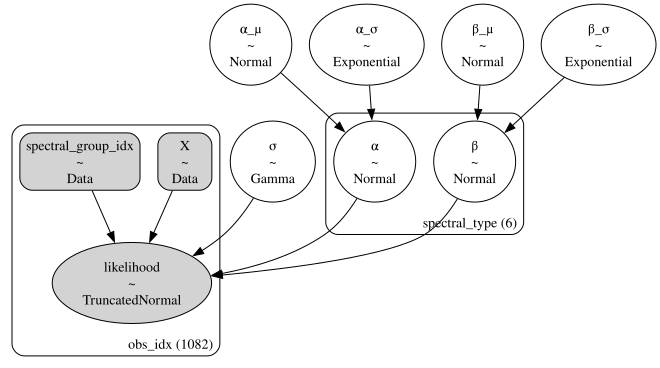

In [36]:
hl_mbr_6gps.to_graphviz()

In [98]:
with hl_mbr_6gps:
    idata_6gps = pm.sample_prior_predictive()

Sampling: [likelihood, α, α_μ, α_σ, β, β_μ, β_σ, σ]


array([<Axes: xlabel='likelihood'>], dtype=object)

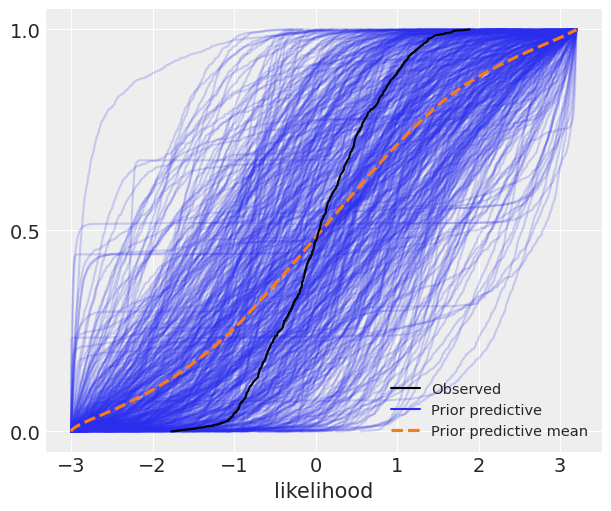

In [99]:
f, ax = pp.subplots(figsize=(6,5))
az.plot_ppc(idata_6gps, kind= 'cumulative', group='prior', ax=ax, observed=True)

In [100]:
with hl_mbr_6gps:
    idata_6gps.extend(pm.sample(2000, chains=4))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 13 seconds.


/var/folders/c9/p_x94m2j357984db558g2n9m0000gn/T/ipykernel_67001/3503679421.py:3: UserWarning: The figure layout has changed to tight
  f_trace.tight_layout()


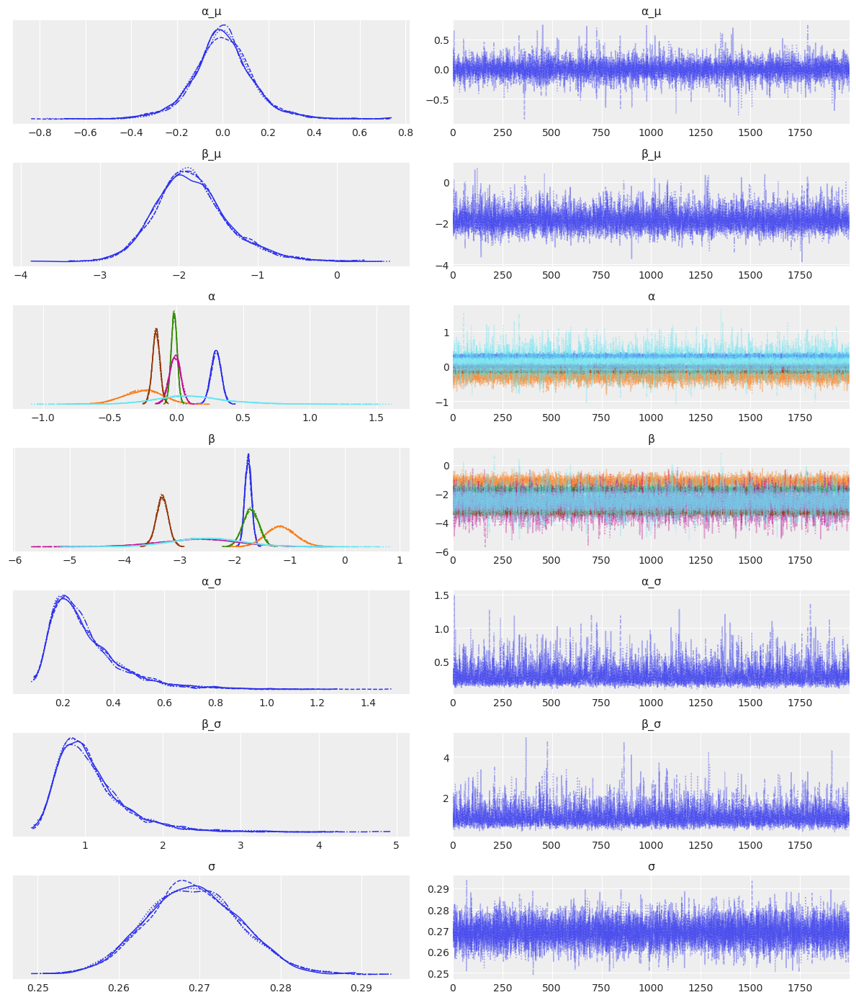

In [101]:
az.plot_trace(idata_6gps)
f_trace = pp.gcf()
f_trace.tight_layout()

In [110]:
az.summary(idata_6gps, var_names=['α', 'β'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
α[Rrs411],0.297,0.038,0.228,0.371,0.000,0.000,9205.0,5528.0,1.0
α[Rrs443],-0.253,0.144,-0.522,0.016,0.002,0.002,8070.0,6172.0,1.0
α[Rrs489],-0.017,0.022,-0.059,0.025,0.000,0.000,11547.0,6193.0,1.0
α[Rrs510],-0.011,0.042,-0.086,0.071,0.000,0.000,8360.0,6341.0,1.0
α[Rrs555],-0.153,0.028,-0.208,-0.101,0.000,0.000,8009.0,6259.0,1.0
α[Rrs670],0.115,0.278,-0.408,0.638,0.003,0.004,7213.0,5059.0,1.0
β[Rrs411],-1.755,0.063,-1.878,-1.642,0.001,0.001,9284.0,5955.0,1.0
β[Rrs443],-1.161,0.264,-1.643,-0.655,0.003,0.003,7551.0,6136.0,1.0
β[Rrs489],-1.706,0.141,-1.967,-1.440,0.001,0.002,11085.0,6052.0,1.0
β[Rrs510],-2.656,0.717,-4.038,-1.328,0.008,0.008,9043.0,6441.0,1.0


array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

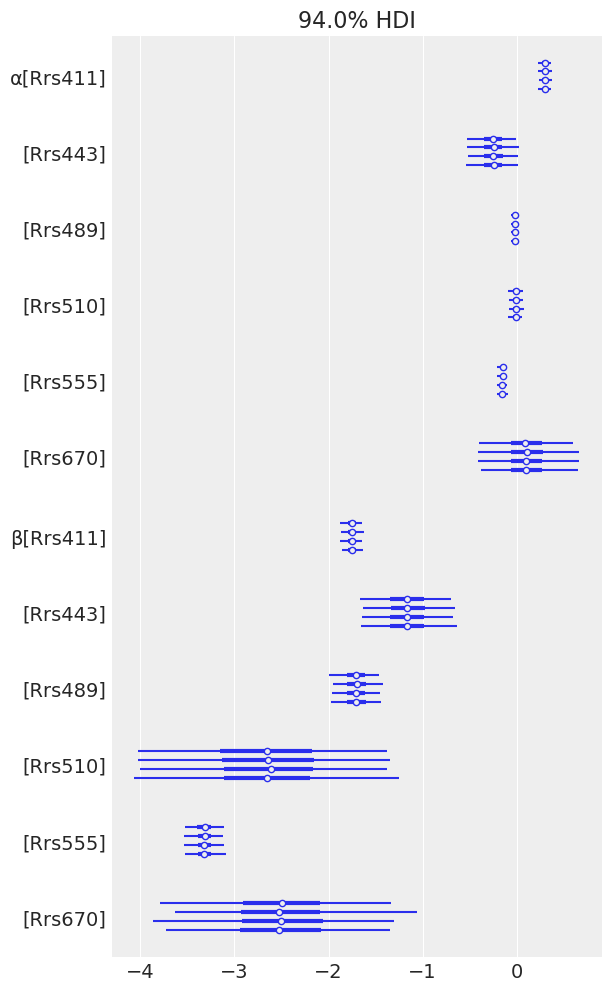

In [107]:
az.plot_forest(idata_6gps, var_names=['α', 'β'])

In [102]:
with hl_mbr_6gps:
    idata_6gps.extend(pm.sample_posterior_predictive(idata_6gps))

Sampling: [likelihood]


Output()

array([<Axes: xlabel='likelihood'>], dtype=object)

/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


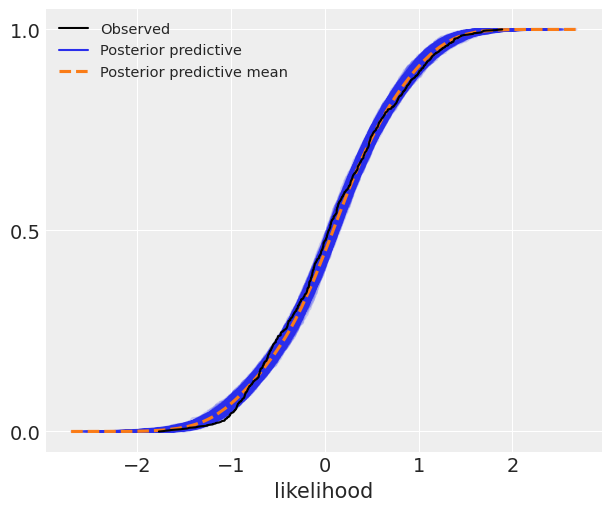

In [103]:
f_hlmbr_6gps_postpc, ax = pp.subplots(figsize=(6,5))
az.plot_ppc(idata_6gps, kind='cumulative', group='posterior', ax=ax)

## Modeling Heteroscedasticity
To evaluate the role of heteroscedasticity in chlorophyll prediction, we next consider three distinct dispersion parameter formulations, each specifying a different structure for the standard deviation parameter σ in the Truncated Normal likelihood:

1. Group-specific constant dispersion parameter (Model #4):
Each group (defined by MBR band numerator) received its own constant dispersion parameter term:

$$
\sigma_i \sim \text{Gamma}(\sigma_{\gamma}, \sigma_{\phi}) \tag{1}
$$

$$
\sigma = \sigma_i[\text{group\_idx}] \tag{2}
$$

2. Global linear dispersion parameter model (Model #5):
Here, dispersion parameter was modeled as a log-linear function of the predictor (log-transformed MBR), shared across all groups, with each term receiving a weakly informative prior:


$$
\sigma_{\alpha}\sim \mathcal{N}(\mu_{\alpha}, \tau_{\alpha}) \tag{3}
$$

$$
\sigma_{\beta} \sim \mathcal{N}(\mu_{\beta}, \tau_{\beta}) \tag{4}
$$

$$
\log \sigma = \sigma_{\alpha} + \sigma_{\beta} X \tag{5}
$$

$$
\sigma = \exp(\log \sigma) \tag{6}
$$

3. Hierarchical linear dispersion parameter model (Model #6):
A hierarchical formulation was used where both the intercept and slope of the log-linear dispersion parameter model were allowed to vary by group, with partial pooling:

$$
\sigma_{\alpha}^{(i)} \sim \mathcal{N}(\mu_{\alpha}, \tau_{\alpha}) \tag{7}
$$

$$
\sigma_{\beta}^{(i)} \sim \mathcal{N}(\mu_{\beta}, \tau_{\beta}) \tag{8}
$$

$$
\log \sigma^{(i)} = \sigma_{\alpha}^{(i)} + \sigma_{\beta}^{(i)} X \tag{9}
$$

$$
\sigma^{(i)} = \exp(\log \sigma^{(i)}) \tag{10}
$$

### Model 4. Hierarchical Partial Pooling Model with Group-Wise dispersion parameter (σ) Term
Noticing that the data seems noisier depending on Maximum Band used for the MBR numerator, I use partial pooling for the dispersion parameter term resulting in a σ for of the 4 Band ratio group. 

In [282]:
X = df_training.log_MBR
y = df_training.log_chl
with pm.Model(coords=COORDS) as hl_mbr_het:
    
    # Register group index and predictor with obs dimensions
    group_idx = pm.Data('group_idx', mbr_type_idx, dims='obs_idx')
    X_data = pm.Data('X', X.values, dims='obs_idx')

    # ------- Hyper-priors ---------
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.Exponential('α_σ', 1)
    β_μ = pm.Normal('β_μ', 0, 1)
    β_σ = pm.Exponential('β_σ', 1)
    σ_γ = pm.Exponential('σ_γ', 1)
    σ_φ = pm.Exponential('σ_φ', 1)

    # ------- Priors ---------------
    α = pm.Normal('α', α_μ, α_σ, dims='MBR_numerator')
    β = pm.Normal('β', β_μ, β_σ, dims='MBR_numerator')
    σ_ = pm.Gamma('σ', σ_γ, σ_φ, dims='MBR_numerator')

    # ------- Likelihood ------------
    μ = α[group_idx] + β[group_idx] * X_data
    σ = σ_[group_idx]
    likelihood = pm.TruncatedNormal(
        'likelihood', mu=μ, sigma=σ, lower=-3, upper=3.2, observed=y, dims='obs_idx')


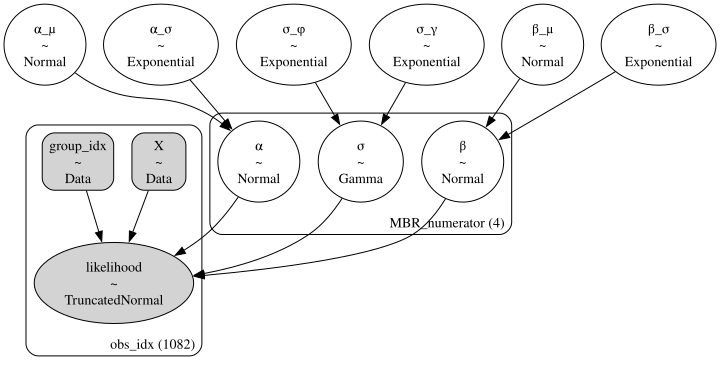

In [283]:
hl_mbr_het.to_graphviz()

In [284]:
with hl_mbr_het:
    idata_hlmbr_het = pm.sample_prior_predictive()

Sampling: [likelihood, α, α_μ, α_σ, β, β_μ, β_σ, σ, σ_γ, σ_φ]
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/pymc/distributions/continuous.py:547: RuntimeWarning: divide by zero encountered in divide
  a=((lower - mu) / sigma).astype("float64"),
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/pymc/distributions/continuous.py:548: RuntimeWarning: divide by zero encountered in divide
  b=((upper - mu) / sigma).astype("float64"),


array([<Axes: xlabel='likelihood'>], dtype=object)

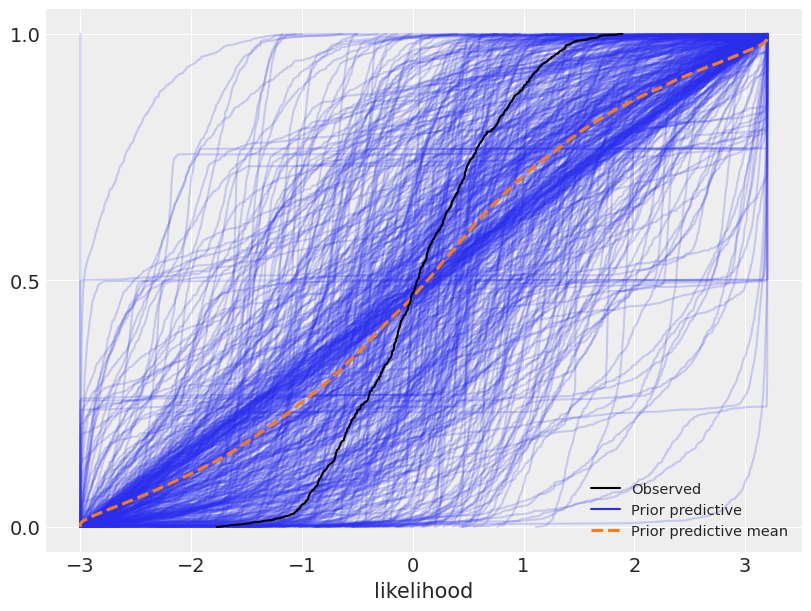

In [285]:
fpr4, ax = pp.subplots(figsize=(8, 6))
az.plot_ppc(idata_hlmbr_het, group='prior', observed=True, ax=ax, kind='cumulative')

In [286]:
with hl_mbr_het:
    idata_hlmbr_het.extend(pm.sample(draws=2000, chains=4))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, σ_γ, σ_φ, α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 13 seconds.


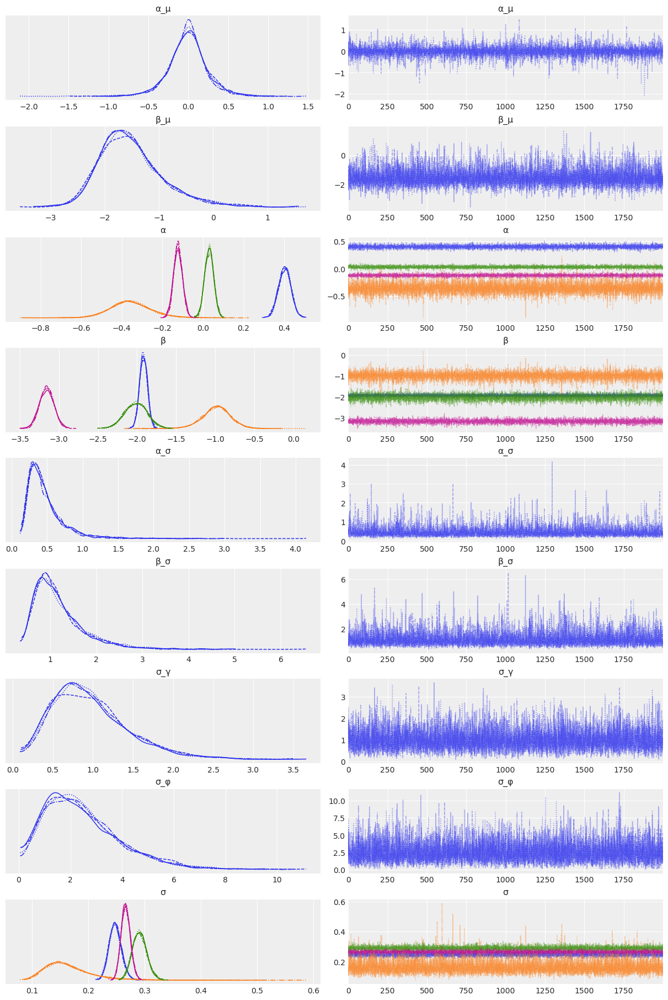

In [287]:
axes = az.plot_trace(idata_hlmbr_het )


In [288]:
with hl_mbr_het:
    idata_hlmbr_het.extend(pm.sample_posterior_predictive(idata_hlmbr_het))

Sampling: [likelihood]


Output()

<Axes: xlabel='likelihood'>

/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


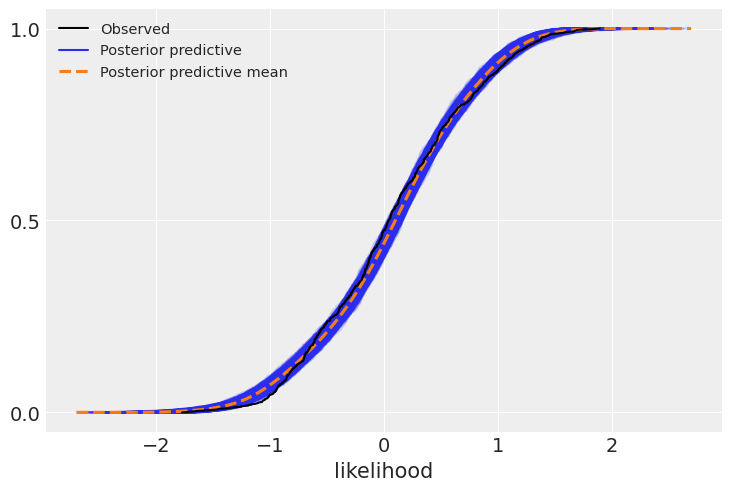

In [289]:
az.plot_ppc(idata_hlmbr_het, kind='cumulative')

### Model 5 - Hierarchical Partiall Pooling Linear Model with Linear Heteroscedasticity



In [290]:
X = df_training.log_MBR
y = df_training.log_chl
with pm.Model(coords=COORDS) as hl_mbr_lin_het:
    # Register group index and predictor with obs dimensions
    group_idx = pm.Data('group_idx', mbr_type_idx, dims='obs_idx')
    X_data = pm.Data('X', X.values, dims='obs_idx')
    # ------- Hyper-priors ---------
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.Exponential('α_σ', 1)
    β_μ = pm.Normal('β_μ', 0, 1)
    β_σ = pm.Exponential('β_σ', 1)

    # ------- Priors ---------------
    α = pm.Normal('α', α_μ, α_σ, dims='MBR_numerator')
    β = pm.Normal('β', β_μ, β_σ, dims='MBR_numerator')
    σ_α = pm.Normal('σ_α', 0, 1)
    σ_β = pm.Normal('σ_β', 0, 1)
   
    μ = α[group_idx] + β[group_idx] * X_data
    log_σ = σ_α + σ_β * X_data
    σ = pm.Deterministic('σ', pm.math.exp(log_σ))
    likelihood = pm.TruncatedNormal(
        'likelihood', mu=μ, sigma=σ, lower=-3, upper=3.2, observed=y, dims='obs_idx')

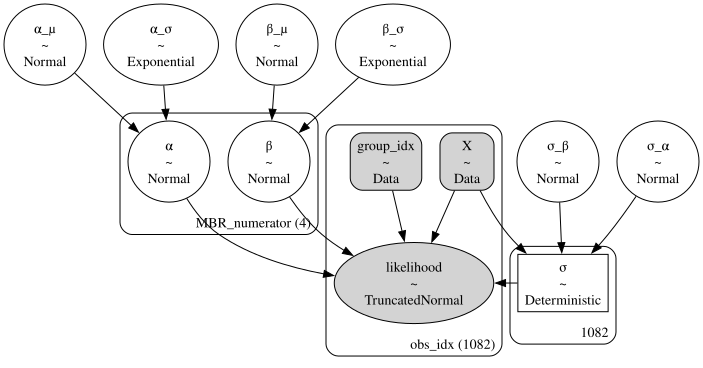

In [291]:
hl_mbr_lin_het.to_graphviz()

In [292]:
with hl_mbr_lin_het:
    idata_hlmbr_lin_het = pm.sample_prior_predictive()

Sampling: [likelihood, α, α_μ, α_σ, β, β_μ, β_σ, σ_α, σ_β]


<Axes: xlabel='likelihood'>

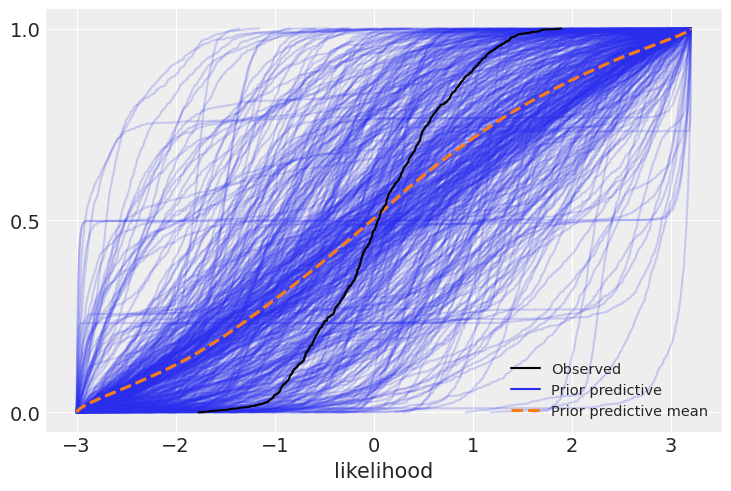

In [293]:
az.plot_ppc(idata_hlmbr_lin_het, group='prior', observed=True, kind='cumulative')

In [294]:
with hl_mbr_lin_het:
    idata_hlmbr_lin_het.extend(pm.sample(draws=2000, chains=4))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, α, β, σ_α, σ_β]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 12 seconds.


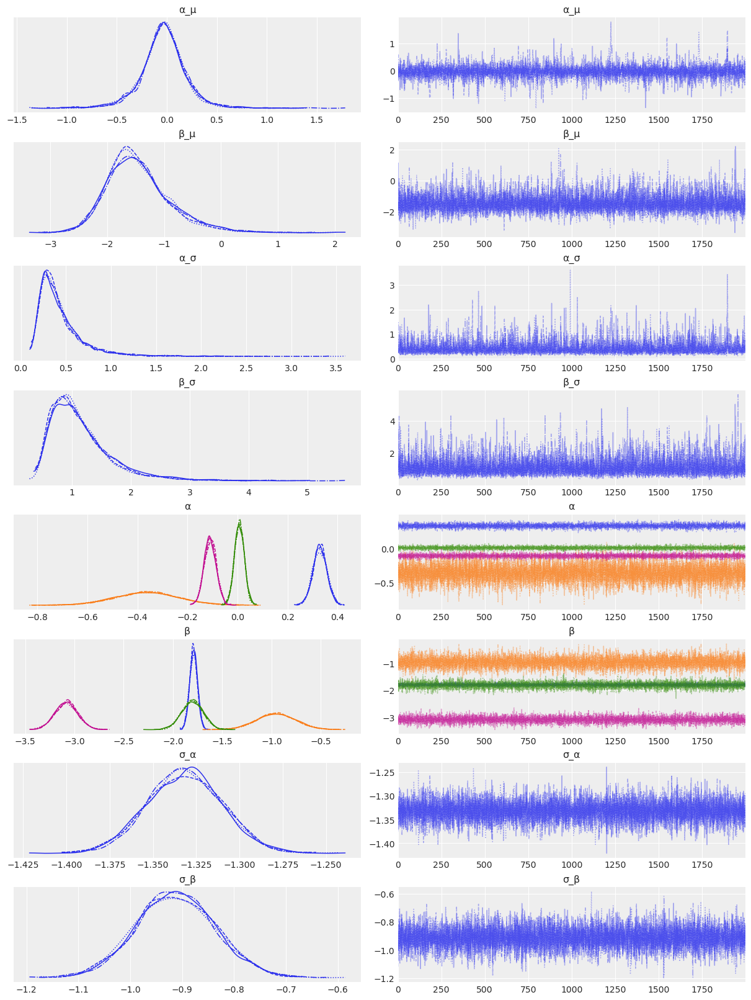

In [295]:
axes = az.plot_trace(
    idata_hlmbr_lin_het, var_names=[
        'α_μ', 'β_μ', 'α_σ', 'β_σ', 'α', 'β', 'σ_α', 'σ_β'])

In [296]:
with hl_mbr_lin_het:
    idata_hlmbr_lin_het.extend(pm.sample_posterior_predictive(idata_hlmbr_lin_het))

Sampling: [likelihood]


Output()

/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/erdemkarakoylu/miniconda3/envs/pymc_base/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


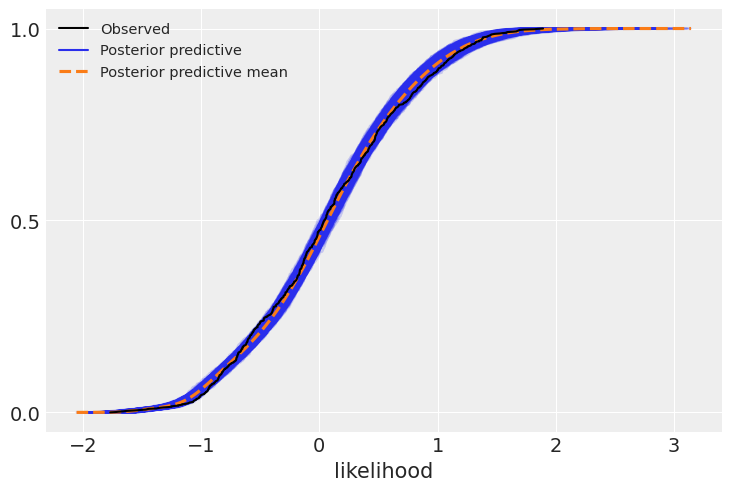

In [297]:
axes = az.plot_ppc(idata_hlmbr_lin_het, kind='cumulative')

### Model 6 - Hierarchical Partial Pooling Linear Model with Hierarchical Linear Heteroscedasticity

In [298]:
X = df_training.log_MBR
y = df_training.log_chl
with pm.Model(coords=COORDS) as hl_mbr_hl_het:
    # Register group index and predictor with obs dimensions
    group_idx = pm.Data('group_idx', mbr_type_idx, dims='obs_idx')
    X_data = pm.Data('X', X.values, dims='obs_idx')
    # ------- Hyper-priors ---------
    # μ (mean) term
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.Exponential('α_σ', 1)
    β_μ = pm.Normal('β_μ', 0, 1)
    β_σ = pm.Exponential('β_σ', 1)
    # σ (dispersion parameter) term
    σ_α_μ = pm.Normal('σ_α_μ', 0, 1)
    σ_α_σ = pm.Exponential('σ_α_σ', 1)
    σ_β_μ = pm.Normal('σ_β_μ', 0, 1)
    σ_β_σ = pm.Exponential('σ_β_σ', 1)
    
    # ------- Priors -----------------
    α = pm.Normal('α', α_μ, α_σ, dims='MBR_numerator')
    β = pm.Normal('β', β_μ, β_σ, dims='MBR_numerator')
    σ_α = pm.Normal('σ_α', σ_α_μ, σ_α_σ, dims='MBR_numerator')
    σ_β = pm.Normal('σ_β', σ_β_μ, σ_β_σ, dims='MBR_numerator')
    
    # ------ Likelihood --------------
    #σ_ = pm.Gamma('σ_', σ_γ, σ_φ, dims='MBR_numerator')
    μ = α[group_idx] + β[group_idx] * X_data
    log_σ = σ_α[group_idx] + σ_β[group_idx] * X_data
    σ = pm.Deterministic('σ', pm.math.exp(log_σ))
    likelihood = pm.TruncatedNormal(
        'likelihood', mu=μ, sigma=σ, lower=-3, upper=3.2, observed=y, dims='obs_idx')

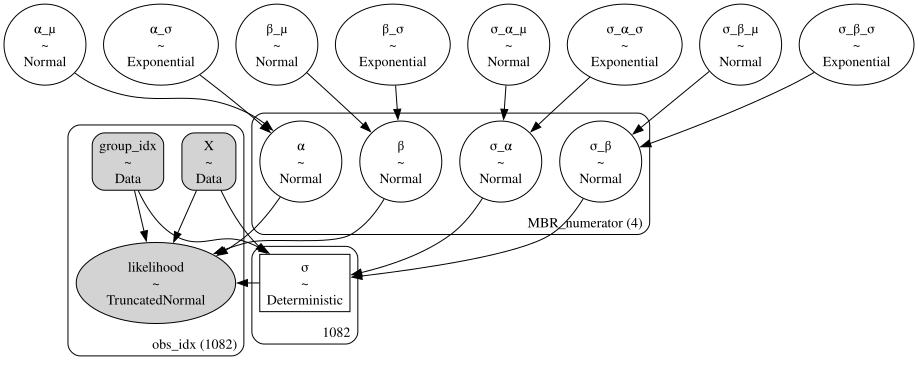

In [299]:
hl_mbr_hl_het.to_graphviz()

In [300]:
with hl_mbr_hl_het:
    idata_hlmbr_hl_het = pm.sample_prior_predictive()

Sampling: [likelihood, α, α_μ, α_σ, β, β_μ, β_σ, σ_α, σ_α_μ, σ_α_σ, σ_β, σ_β_μ, σ_β_σ]


(-3.0, 3.0)

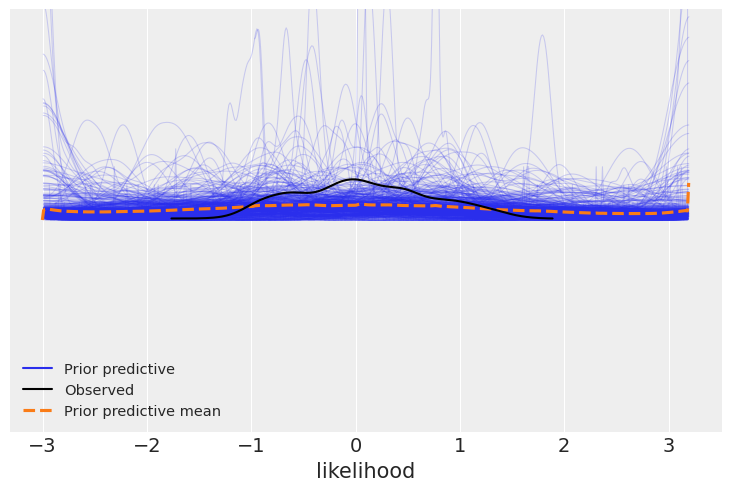

In [303]:
f, ax = pp.subplots()
az.plot_ppc(idata_hlmbr_hl_het, group='prior', observed=True, ax=ax)
ax.set_ylim(-3, 3)

In [304]:
with hl_mbr_hl_het:
    idata_hlmbr_hl_het.extend(pm.sample(draws=2000, chains=4))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, σ_α_μ, σ_α_σ, σ_β_μ, σ_β_σ, α, β, σ_α, σ_β]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 23 seconds.


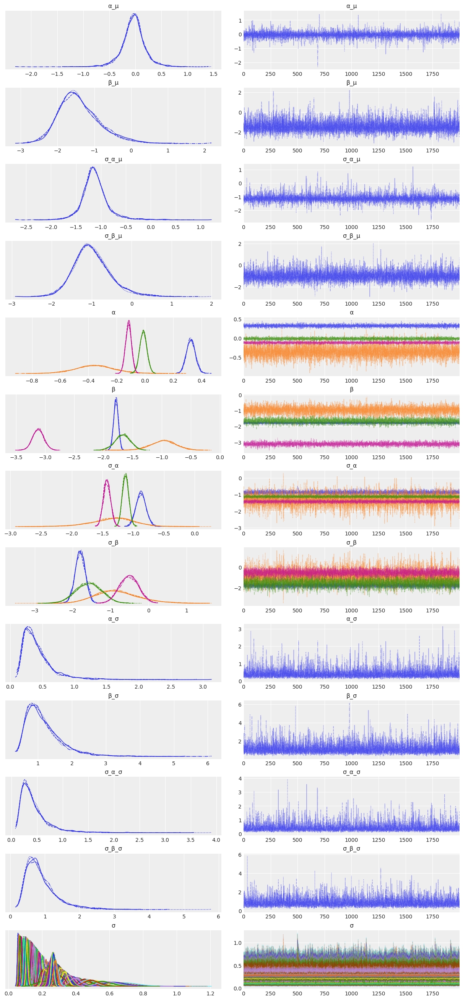

In [306]:
axs = az.plot_trace(idata_hlmbr_hl_het)

### Beyond Heteroscedasticity - Fluorescence- vs HPLC-Based Noise:

In this section, we address potential differences in observation noise between chlorophyll measurements obtained via fluorescence and those obtained via HPLC.

Fluorescence-based measurements are generally considered less precise, with variability that scales with the signal itself. To capture this behavior, we introduce an additive offset term to the logarithm of the observation noise standard deviation. Modeling noise in log-space not only ensures positivity but also accommodates multiplicative error structures, common in fluorescence-based observations.

To implement this, we extend the hierarchical linear formulation of $\log \sigma$ used previously by incorporating an additive term $\gamma$, which is activated only for fluorescence-derived observations. The binary chl_type flag used during exploratory data analysis is set to 0 for fluorescence and 1 for HPLC, so the term $\gamma (1 - chl\_type)$ increases the predicted noise for fluorescence while leaving HPLC observations unaffected. This formulation allows us to directly assess the contribution of measurement method to overall uncertainty:
$$ \log \sigma^{(i)} = \sigma_{\alpha}^{(i)} + \sigma_{\beta}^{(i)} X +\gamma (1-chl\_type)\tag{10}$$


In [316]:
X = df_training.log_MBR
y = df_training.log_chl
with pm.Model(coords=COORDS) as hl_mbr_hl_het_fluo_noise:
    # Register group index and predictor with obs dimensions
    group_idx = pm.Data('group_idx', mbr_type_idx, dims='obs_idx')
    X_data = pm.Data('X', X.values, dims='obs_idx')
    chl_type_idx_shared = pm.Data("chl_type_idx", chl_type_idx, dims="obs_idx")

    # ------- Hyper-priors ---------
    # μ (mean) term
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.Exponential('α_σ', 1)
    β_μ = pm.Normal('β_μ', 0, 1)
    β_σ = pm.Exponential('β_σ', 1)
    # σ (dispersion parameter) term
    σ_α_μ = pm.Normal('σ_α_μ', 0, 1)
    σ_α_σ = pm.Exponential('σ_α_σ', 1)
    σ_β_μ = pm.Normal('σ_β_μ', 0, 1)
    σ_β_σ = pm.Exponential('σ_β_σ', 1)
    
    # ------- Priors -----------------
    α = pm.Normal('α', α_μ, α_σ, dims='MBR_numerator')
    β = pm.Normal('β', β_μ, β_σ, dims='MBR_numerator')
    σ_α = pm.Normal('σ_α', σ_α_μ, σ_α_σ, dims='MBR_numerator')
    σ_β = pm.Normal('σ_β', σ_β_μ, σ_β_σ, dims='MBR_numerator')
    γ_chl_type = pm.Normal("γ_chl_type", mu=0, sigma=1) # fluorescence measurement noise contribution



    # ------ Likelihood --------------
    #σ_ = pm.Gamma('σ_', σ_γ, σ_φ, dims='MBR_numerator')
    μ = α[group_idx] + β[group_idx] * X_data
    log_σ = (
        σ_α[group_idx]
        + σ_β[group_idx] * X_data
        + γ_chl_type * (1 - chl_type_idx_shared)
        )
    σ = pm.Deterministic("σ", pm.math.exp(log_σ))
    #log_σ = σ_α[group_idx] + σ_β[group_idx] * X_data + \gamma
    #σ = pm.Deterministic('σ', pm.math.exp(log_σ))
    likelihood = pm.TruncatedNormal(
        'likelihood', mu=μ, sigma=σ, lower=-3, upper=3.2, observed=y, dims='obs_idx')

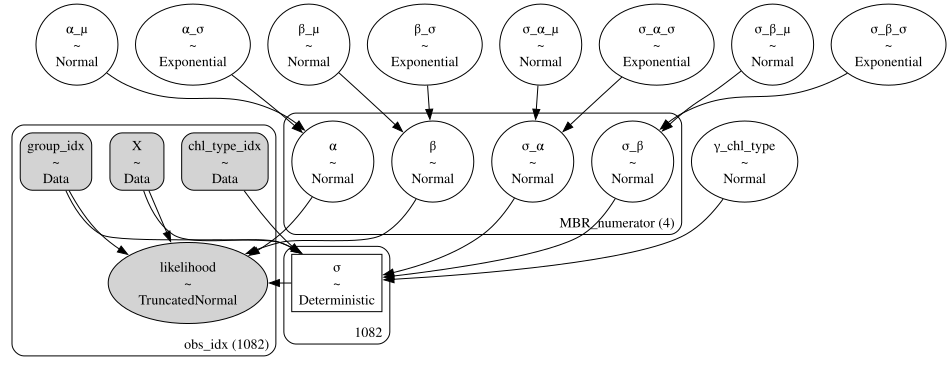

In [317]:
hl_mbr_hl_het_fluo_noise.to_graphviz()

In [323]:
with hl_mbr_hl_het_fluo_noise:
    idata_hlmbr_hl_het_fn = pm.sample_prior_predictive()

Sampling: [likelihood, α, α_μ, α_σ, β, β_μ, β_σ, γ_chl_type, σ_α, σ_α_μ, σ_α_σ, σ_β, σ_β_μ, σ_β_σ]


(-0.1, 3.0)

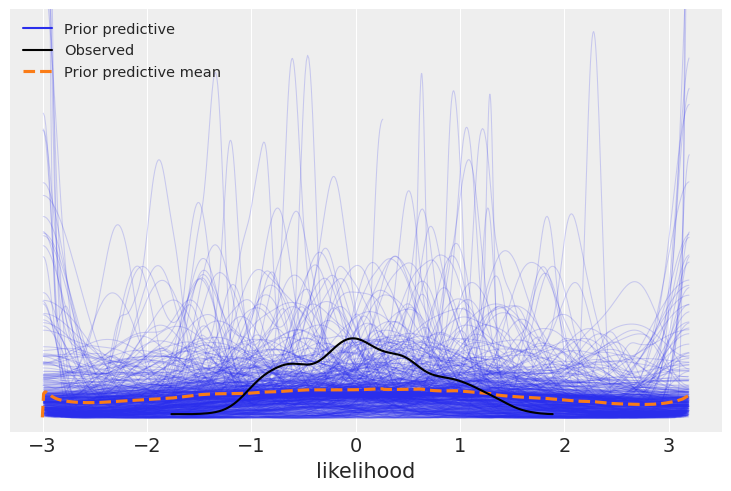

In [ ]:
fprior7, ax = pp.subplots()
az.plot_ppc(idata_hlmbr_hl_het_fn, group='prior', observed=True, ax=ax)
ax.set_ylim(-0.1, 3)

In [324]:
with hl_mbr_hl_het_fluo_noise:
    idata_hlmbr_hl_het_fn.extend(pm.sample(draws=2000, chains=4, target_accept=0.95))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, σ_α_μ, σ_α_σ, σ_β_μ, σ_β_σ, α, β, σ_α, σ_β, γ_chl_type]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 34 seconds.


array([[<Axes: title={'center': 'α_μ'}>, <Axes: title={'center': 'α_μ'}>],
       [<Axes: title={'center': 'β_μ'}>, <Axes: title={'center': 'β_μ'}>],
       [<Axes: title={'center': 'σ_α_μ'}>,
        <Axes: title={'center': 'σ_α_μ'}>],
       [<Axes: title={'center': 'σ_β_μ'}>,
        <Axes: title={'center': 'σ_β_μ'}>],
       [<Axes: title={'center': 'α'}>, <Axes: title={'center': 'α'}>],
       [<Axes: title={'center': 'β'}>, <Axes: title={'center': 'β'}>],
       [<Axes: title={'center': 'σ_α'}>, <Axes: title={'center': 'σ_α'}>],
       [<Axes: title={'center': 'σ_β'}>, <Axes: title={'center': 'σ_β'}>],
       [<Axes: title={'center': 'γ_chl_type'}>,
        <Axes: title={'center': 'γ_chl_type'}>],
       [<Axes: title={'center': 'α_σ'}>, <Axes: title={'center': 'α_σ'}>],
       [<Axes: title={'center': 'β_σ'}>, <Axes: title={'center': 'β_σ'}>],
       [<Axes: title={'center': 'σ_α_σ'}>,
        <Axes: title={'center': 'σ_α_σ'}>],
       [<Axes: title={'center': 'σ_β_σ'}>,
       

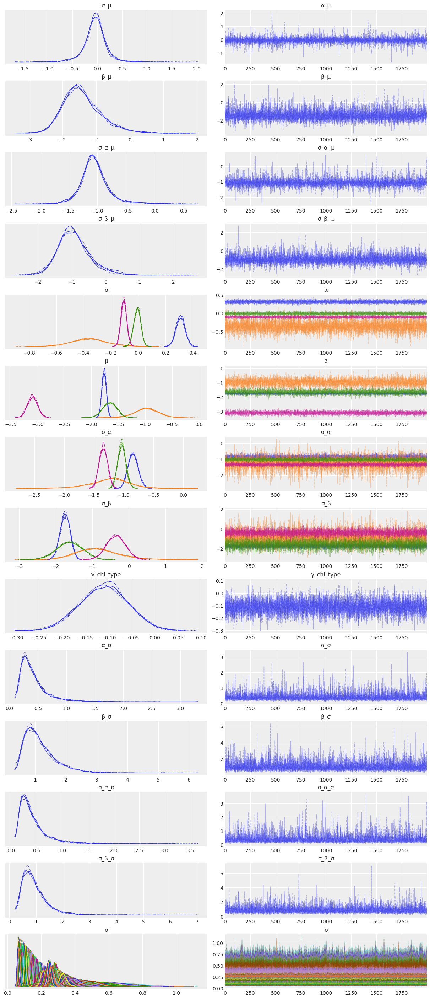

In [325]:
az.plot_trace(idata_hlmbr_hl_het_fn)

<Axes: title={'center': 'γ_chl_type'}>

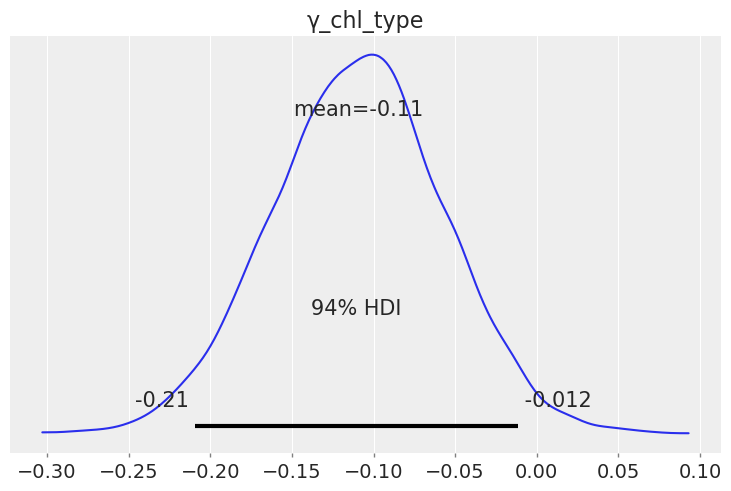

In [327]:
az.plot_posterior(idata_hlmbr_hl_het_fn, var_names='γ_chl_type')

In [328]:
with hl_mbr_hl_het_fluo_noise:
    idata_hlmbr_hl_het_fn.extend(
        pm.sample_posterior_predictive(idata_hlmbr_hl_het_fn))

Sampling: [likelihood]


Output()

In [330]:
df_training.head()

,id,lat,lon,etopo2,oisst,Rrs411,Rrs443,Rrs489,Rrs510,Rrs555,Rrs670,MBR,log_MBR,MBR_flag,chl,max_band_all_flag,log_chl,hplc_flag
0,1565,38.4279,-76.61,0.0,3.70,0.001204,0.001686,0.003293,0.004036,0.007479,0.003465,0.368826,-0.433178,Rrs510,38.19,Rrs555,1.581950,fluo
1,1566,38.3680,-76.50,0.0,3.70,0.001062,0.001384,0.002173,0.002499,0.004152,0.001695,0.427444,-0.369121,Rrs510,35.01,Rrs555,1.544192,fluo
2,1567,38.3074,-76.44,1.0,3.70,0.000971,0.001185,0.001843,0.002288,0.004246,0.001612,0.390537,-0.408338,Rrs510,26.91,Rrs555,1.429914,fluo
3,1568,38.6367,-76.32,3.0,3.70,0.001472,0.001741,0.002877,0.003664,0.006982,0.003234,0.358694,-0.445276,Rrs510,47.96,Rrs555,1.680879,fluo
4,1559,38.3047,-76.44,1.0,22.03,0.000905,0.001022,0.001506,0.001903,0.002801,0.001791,0.414576,-0.382395,Rrs510,23.55,Rrs555,1.371991,fluo


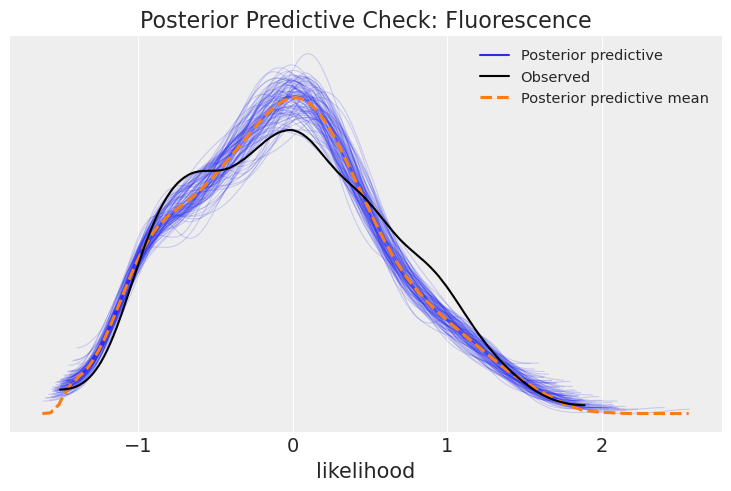

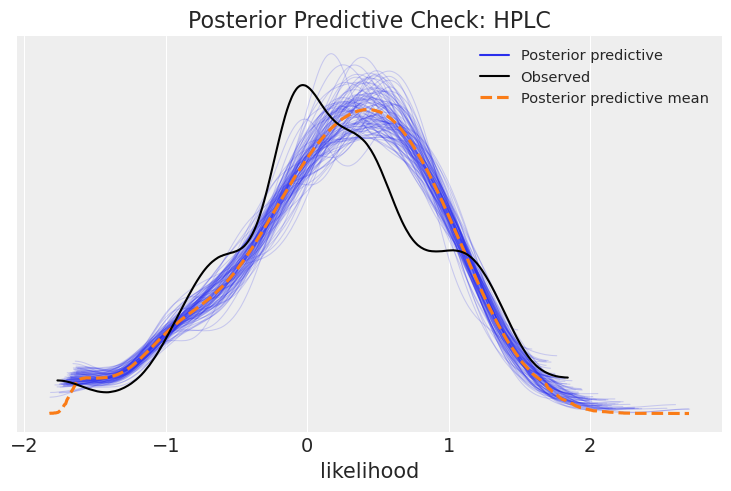

In [335]:
is_fluo = df_training["hplc_flag"] == 'fluo'
is_hplc = df_training["hplc_flag"] == 'hplc'
obs_fluo = df_training.index[is_fluo]
obs_hplc = df_training.index[is_hplc]
idata_fluo = idata_hlmbr_hl_het_fn.sel(obs_idx=obs_fluo)
idata_hplc = idata_hlmbr_hl_het_fn.sel(obs_idx=obs_hplc)

az.plot_ppc(idata_fluo, var_names=["likelihood"], num_pp_samples=100, jitter=0.05)
pp.title("Posterior Predictive Check: Fluorescence")
pp.show()

az.plot_ppc(idata_hplc, var_names=["likelihood"], num_pp_samples=100, jitter=0.05)
pp.title("Posterior Predictive Check: HPLC")
pp.show()


Contrary to prior assumptions, the posterior distribution for the fluorescence-specific noise offset ($\gamma_{\text{chl}}$) was concentrated below zero, with a 94% HDI of [−0.21, 0.012], suggesting that fluorescence-derived chlorophyll measurements were slightly less noisy than HPLC-derived observations in this dataset. This finding runs contrary to the prior expectation that fluorescence measurements are noisier. However it is not a modeling artifact — it's a real signal in the data implying that 
* Either HPLC noise is greater than assumed (e.g., due to lab variation, batch effects),
* Or fluorescence is surprisingly consistent in your dataset, possibly due to standardized protocols or strong preprocessing.
The data does not allow us to speculate further but this should be investigated further.

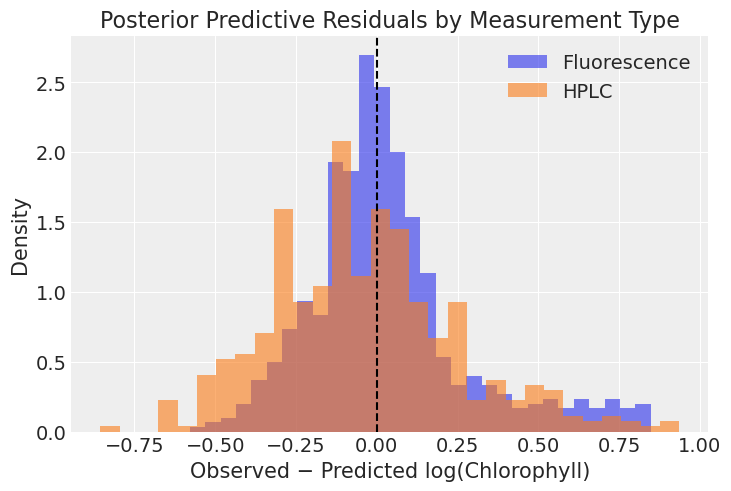

In [ ]:
# Convert posterior predictive mean to NumPy array
y_pp_mean = idata_hlmbr_hl_het_fn.posterior_predictive["likelihood"].mean(dim=["chain", "draw"]).values

# Observed values as NumPy array
y_obs = df_training["log_chl"].values

# Residuals
residuals = y_obs - y_pp_mean

# Ensure masks are NumPy arrays (drop index alignment)
is_fluo_np = df_training["hplc_flag"].values == 'fluo'
is_hplc_np = df_training["hplc_flag"].values == 'hplc'

# Plot histograms
pp.hist(residuals[is_fluo_np], bins=30, alpha=0.6, label="Fluorescence", density=True)
pp.hist(residuals[is_hplc_np], bins=30, alpha=0.6, label="HPLC", density=True)
pp.axvline(0, color="black", linestyle="--")
pp.legend()
pp.title("Posterior Predictive Residuals by Measurement Type")
pp.xlabel("Observed − Predicted log(Chlorophyll)")
pp.ylabel("Density")
pp.show()


### Posterior Predictive Residuals by Measurement Type (suggested for results section)
To evaluate the model’s performance across measurement types, we conducted posterior predictive checks stratified by whether chlorophyll observations were derived from fluorescence or HPLC. The model closely captured the distribution of fluorescence-based observations, with residuals tightly centered around zero. In contrast, residuals for HPLC-based observations were more dispersed, particularly in the low-chlorophyll regime (log₁₀(Chl) < 0). Fluorescence measurements exhibited greater posterior predictive density near zero residuals, suggesting a tighter model fit and lower predictive uncertainty. This pattern challenges the prior expectation that fluorescence-derived observations would be noisier, and instead points to greater variability or systematic effects in HPLC observations at low concentrations.


### Interpreting Measurement-Type-Dependent Uncertainty (suggested for discussion section)
Contrary to the initial hypothesis that fluorescence-derived chlorophyll measurements would exhibit greater noise, posterior predictive checks revealed that model residuals were more dispersed for HPLC-based observations, particularly in low-chlorophyll waters. This finding may reflect heterogeneity in HPLC measurement procedures, including variability in extraction protocols, instrumentation, or inter-laboratory calibration. The observed asymmetry in residual structure motivated the introduction of a measurement-type-specific interaction term in the log-noise model, allowing uncertainty to vary with both method and signal magnitude. Future work could further disentangle these effects by conditioning on known sources of variability such as laboratory identity, sampling equipment, analyst, or region. Expanding metadata collection to include these factors and incorporating them as hierarchical levels in the model could clarify whether residual dispersion is due to methodological differences or environmental sampling context.

# A Primer on Bayesian Model Comparison: WAIC vs. LOO (and Alternatives)
When comparing Bayesian regression models – such as polynomial regressions, hierarchical partial pooling models, or more complex machine-learning models like BART (Bayesian Additive Regression Trees) – we need techniques that account for both model fit and complexity. All these models have the same likelihood;  a truncated normal $N(\mu,\sigma)$ constrained on the $log(Chl a)$ scale to $[-3, 3.2]$ corresponding to pigment concentrations with $0.001 - 1500 mg\ m^{-3}$, to insure model outputs are realistic. The truncated normal likelihood has mean $\mu$ given by the regression and $\sigma$ a dispersion parameter scale. Beyond this likelihood formulation, models differ in how $\mu$ (and possibly $\sigma$ when heteroscedasticity is assumed) are expressed.

Bayesian model comparison focuses on predictive performance and model evidence, rather than just point estimates. Two popular approaches are the Watanabe–Akaike Information Criterion (WAIC) and Leave-One-Out cross-validation (LOO). We will briefly explain the assumptions and math behind WAIC and LOO, how to use them for Bayesian model selection, and how to implement them in practice (in the present study with the PyMC and ArviZ Python libraries). We’ll also discuss alternative techniques (marginal likelihood/Bayes factors, cross-validation variants, etc.), highlighting strengths and limitations for models that share a likelihood but have differing priors or structures.

## WAIC: Watanabe–Akaike Information Criterion
WAIC (sometimes called Widely Applicable Information Criterion) is a fully Bayesian generalization of classical AIC. WAIC estimates the out-of-sample deviance (or equivalently, expected log predictive density) for a fitted model by using the entire posterior distribution. The key idea is to evaluate how well the model predicts each data point when that data point is treated as new, averaging over the uncertainty in the model parameters. Formally, if $p(y_i \mid \theta)$ is the likelihood for data point $i$ given parameters $\theta$, and we have $S$ posterior draws ${\theta^s}_{s=1}^S$, then the pointwise log predictive density for $y_i$ can be estimated as:

$$ \widehat{\log p(y_i \mid \text{model})} \approx \log \frac{1}{S}\sum_{s=1}^S p(y_i \mid \theta^s) \tag{1} $$

WAIC then adjusts this for model complexity by computing the effective number of parameters $p_{\text{WAIC}}$; the sum of the posterior variances of the log-likelihood for each data point:

$$ p_{\text{WAIC}} = \sum_{i=1}^n \text{Var}_{\theta\sim p(\theta \mid D)}[\log p(y_i \mid \theta)] \tag{2} $$

Intuitively, if the log-likelihood for a given observation varies a lot across the posterior draws, it means the model had to “fit” that data point with many different parameter settings – an indication of flexibility being used (hence a higher effective param count). On the other hand, if the posterior confidently predicts a data point (low variance in log-lik), it’s as if fewer parameters were effectively used for that point. Using these, one can compute the WAIC score (on the deviance scale) as:

   $$ \text{WAIC} = -2 \left( \sum_{i=1}^n \log \frac{1}{S}\sum_{s=1}^S p(y_i \mid \theta^s) - p_{\text{WAIC}} \right) \tag{3} $$

In words, WAIC ≈ –2 * (log predictive accuracy – penalty). A model with lower WAIC is preferred (lower expected deviance = higher predictive accuracy). Equivalently, many software report elpd_WAIC = \text{lppd} - p_{\text{WAIC}}, which is an estimate of the expected log pointwise predictive density; higher elpd is better. WAIC’s formulation makes minimal assumptions (hence “widely applicable”): it works even for models that are not point-identifiable or are “singular” (where traditional asymptotic like BIC fails). The main assumption is that the data are conditionally independent (so the total log-likelihood is sum of pointwise log-likelihoods) and that the posterior draws are representative of the posterior. In our regression models, these conditions hold (each data point contributes a truncated-normal likelihood, independent given $\theta$).

Using WAIC for model selection: WAIC essentially estimates how well the model would predict new data on average. It naturally penalizes model complexity via $p_{\text{WAIC}}$. For example, a simple polynomial regression might have a smaller $p_{\text{WAIC}}$ than a BART model if the latter is using its flexibility to fit fine details. The model with the highest predictive density (lowest WAIC) is generally preferred. In practice, one can look at the standard error of the WAIC (available via jackknife or bootstrap on the pointwise contribution) to judge if differences are meaningful. One must be cautious: if models are very different, WAIC is just a relative metric – it doesn’t tell if either model is absolutely good, just which predicts better. It’s also not valid to interpret WAIC differences like strict probabilities; it’s an information criterion for comparison. 
   
   **Mathematical note**: WAIC has a strong foundation in Bayesian decision theory. In large samples, WAIC is equivalent to Bayesian leave-one-out cross-validation (they both estimate the same quantity: the expected log predictive density). This was proven in the context of “Bayesian predictive information criteria” by Watanabe and others. However, in finite samples WAIC can sometimes under-estimate the effective complexity, especially if the posterior for some points is skewed or if there are influential outliers. In those cases, a related method, PSIS-LOO (described next), is more robust. Nonetheless, WAIC remains a convenient measure as it only requires the posterior draws and the pointwise log-likelihood.

In our scenario, all models have the same likelihood form, so WAIC is comparing how the different prior structures and functional forms (polynomial vs. hierarchical vs. BART, etc.) affect predictive performance. A hierarchical model might achieve a good balance (reducing overfit via partial pooling, thus lower WAIC), whereas an overly flexible model might overfit slightly, increasing its WAIC (worse).



## LOO: Leave-One-Out Cross-Validation (Bayesian)
LOO cross-validation is a direct approach to estimate predictive accuracy: remove each data point in turn, refit (or at least re-evaluate) the model without it, and measure how likely the model would have predicted that left-out point. Repeating this for all points gives an estimate of out-of-sample prediction error. Mathematically, the LOO expected log predictive density (ELPD) is:
   $$ \text{ELPD}_{\text{LOO}} = \sum_{i=1}^n \log p(y_i \mid y_{-i}, M) \tag{4} $$

where $p(y_i \mid y_{-i}, M)$ is the posterior predictive density of $y_i$ given the model $M$ trained on all data except $i$. Computing this exactly is very costly – it would require re-fitting the model $n$ times (for $n$ data points). Fortunately, in Bayesian models we can approximate LOO using the existing full-data posterior draws via importance sampling. The idea (as implemented by Vehtari et al. (2017)
arxiv.org
) is: given draws $\theta^s \sim p(\theta \mid \text{all data})$, we can approximate draws from $p(\theta \mid \text{data minus }i)$ by weighting those draws by $1/p(y_i \mid \theta^s)$. In practice, one computes the LOO log score for each point as:

 $$ \widehat{\log p(y_i \mid y_{-i}, M)} \approx \log \left( \frac{\sum_{s=1}^S w_{is} p(y_i \mid \theta^s)}{\sum_{s=1}^S w_{is}} \right), \quad \text{where} \quad w_{is} = \frac{1}{p(y_i \mid \theta^s)} \tag{5} $$

and uses a clever stabilization called Pareto Smoothed Importance Sampling (PSIS) to avoid a few large weights dominating. The result is an estimate of LOO without separate re-fitting for each point. The sum of these log predictive densities gives $\widehat{\text{ELPD}}_{\text{LOO}}$, often reported as $LOOIC = –2 * {\text{ELPD}}_{\text{LOO}}$ to recast it on the deviance/AIC scale for easier interpretation alongside WAIC. Like WAIC, lower LOOIC (or higher ELPD) indicates better predictive performance.

### WAIC vs LOO

WAIC and LOO both estimate the same target (the model’s expected log predictive accuracy on new data) and are asymptotically equivalent. In finite samples, however, there are differences. WAIC uses the variance of log-likelihood as a penalty; LOO uses the actual leave-one-out approach. If the posterior is approximately multivariate normal and not too sensitive to single points, WAIC and LOO will be very close. PSIS-LOO tends to be more robust when priors are weak or for influential data. Indeed, it’s recommended to prefer PSIS-LOO over WAIC in practice if the computation is feasible, because LOO comes with built-in diagnostics for when it might fail. WAIC has no easy diagnostic to tell if its approximation is off (it might underestimate uncertainty in some cases). In summary, both criteria can be used for model ranking; a significant difference in LOO/WAIC indicates that one model has better predictive performance than the other. If WAIC and LOO disagree noticeably, trust LOO (or actual cross-validation) as it directly assesses predictive fit. In our context (shared truncated-normal likelihood), both WAIC and LOO are applicable. The choice may come down to convenience (WAIC is a one-shot calculation) versus caution (LOO’s diagnostic might alert us if, say, one data point is so extreme that it causes big differences in the hierarchical vs non-hierarchical models’ fits).

### Appendix - Formulae used for Bayesian Model Comparison:

1. **Pointwise Log Predictive Density**  
   $$ \widehat{\log p(y_i \mid \text{model})} \approx \log \frac{1}{S}\sum_{s=1}^S p(y_i \mid \theta^s) \tag{1} $$

2. **Effective Number of Parameters (for WAIC)**  
   $$ p_{\text{WAIC}} = \sum_{i=1}^n \text{Var}_{\theta\sim p(\theta \mid D)}[\log p(y_i \mid \theta)] \tag{2} $$

3. **WAIC Score (Deviance Scale)**  
   $$ \text{WAIC} = -2 \left( \sum_{i=1}^n \log \frac{1}{S}\sum_{s=1}^S p(y_i \mid \theta^s) - p_{\text{WAIC}} \right) \tag{3} $$

4. **Leave-One-Out Cross-Validation (LOO ELPD)**  
   $$ \text{ELPD}_{\text{LOO}} = \sum_{i=1}^n \log p(y_i \mid y_{-i}, M) \tag{4} $$

5. **Approximation to LOO Log Score Using PSIS**  
   $$ \widehat{\log p(y_i \mid y_{-i}, M)} \approx \log \left( \frac{\sum_{s=1}^S w_{is} p(y_i \mid \theta^s)}{\sum_{s=1}^S w_{is}} \right), \quad \text{where} \quad w_{is} = \frac{1}{p(y_i \mid \theta^s)} \tag{5} $$

6. **Bayes Factor**  
   $$ \text{Bayes Factor} = \frac{p(D \mid M_1)}{p(D \mid M_2)} \tag{6} $$

7. **DIC (Deviance Information Criterion)**  
   $$ \text{DIC} = \bar{D} + p_D, \quad \text{where} \quad \bar{D} = -2 \log p(D \mid \theta), \quad p_D = \bar{D} - D(\bar{\theta}) \tag{7} $$

8. **Stacking (Predictive Distribution Weights)**  
   $$ p(y_i \mid M) = \sum_{m=1}^M w_m p(y_i \mid M_m) \tag{8} $$  
   where $w_m$ are the model weights optimized by maximizing predictive accuracy.


## Model Comparison

#### 1. Uncertainty of Model Mean

/var/folders/c9/p_x94m2j357984db558g2n9m0000gn/T/ipykernel_67001/1267459112.py:6: UserWarning: The figure layout has changed to tight
  f.tight_layout()


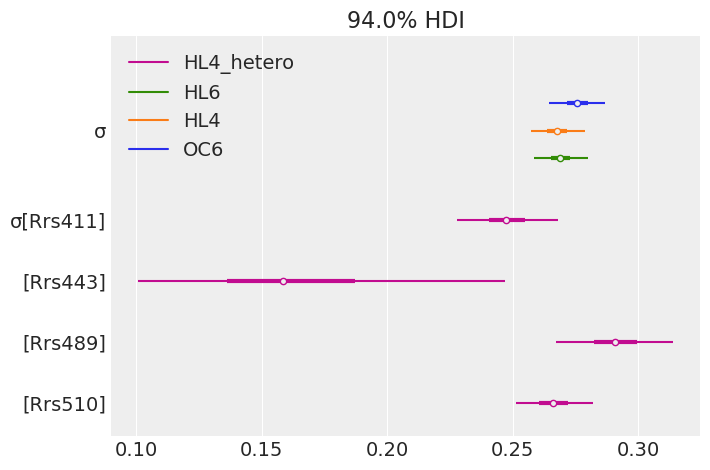

In [ ]:
f, ax = pp.subplots()
az.plot_forest(
    [idata_oc6, idata_hlmbr, idata_6gps, idata_hlmbr_het], 
    model_names=['OC6', 'HL4', 'HL6', 'HL4_hetero'],
    var_names='σ', combined=True, ax=ax)
f.tight_layout()


Text(0.5, 1.0, 'Intercepts -- 94.0% HDI')

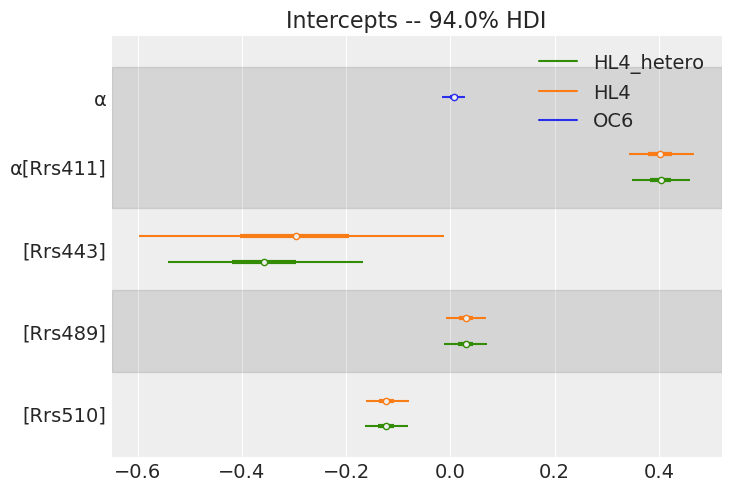

In [222]:
f, ax = pp.subplots()
az.plot_forest(
    [idata_oc6, idata_hlmbr, idata_hlmbr_het], 
    model_names=['OC6','HL4', 'HL4_hetero'],
    var_names='α', combined=True, ax=ax)
ax.set_title('Intercepts -- ' + ax.get_title())

Text(0.5, 1.0, 'Slopes -- 94.0% HDI')

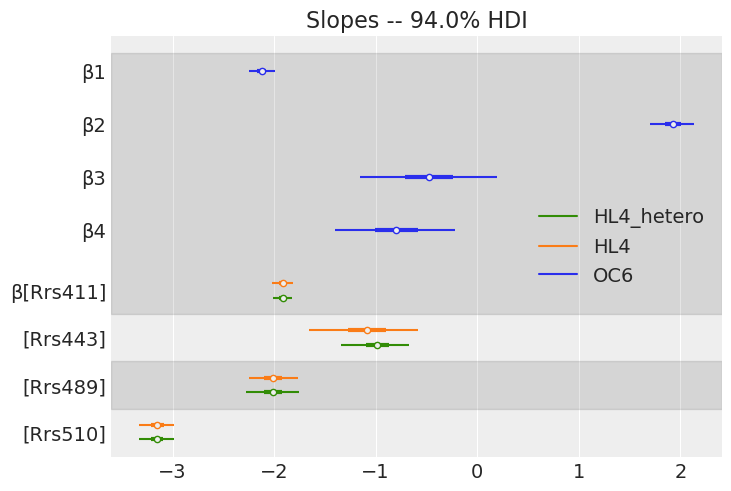

In [221]:
f, ax = pp.subplots()
az.plot_forest(
    [idata_oc6, idata_hlmbr, idata_hlmbr_het], 
    model_names=['OC6','HL4', 'HL4_hetero'],
    var_names=['β1','β2', 'β3', 'β4', 'β'], combined=True, ax=ax)
ax.set_title('Slopes -- ' + ax.get_title())

Text(0.5, 1.0, 'Noise -- 94.0% HDI')

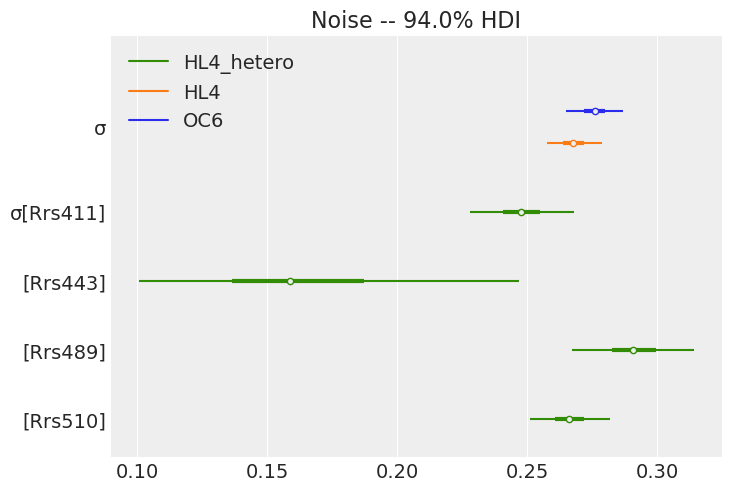

In [ ]:
f, ax = pp.subplots()
az.plot_forest(
    [idata_oc6, idata_hlmbr, idata_hlmbr_het], 
    model_names=['OC6','HL4', 'HL4_hetero'],
    var_names='σ', combined=True, ax=ax)
ax.set_title('Dispersion parameter -- ' + ax.get_title())

In [326]:

with bayes_oc6:
    try:
        _ = pm.compute_log_likelihood(idata_oc6, extend_inferencedata=True)
    except ValueError:
        pass

with hl_mbr:
    try:
        _ = pm.compute_log_likelihood(idata_hlmbr, extend_inferencedata=True)
    except ValueError:
        pass

with hl_mbr_6gps:
    try:
        _ = pm.compute_log_likelihood(idata_6gps, extend_inferencedata=True)
    except ValueError:
        pass

with hl_mbr_het:
    try:
        _ = pm.compute_log_likelihood(idata_hlmbr_het, extend_inferencedata=True)
    except ValueError:
        pass

with hl_mbr_lin_het:
    try:
        _ = pm.compute_log_likelihood(idata_hlmbr_lin_het, extend_inferencedata=True)
    except ValueError:
        pass

with hl_mbr_hl_het:
    try:
        _ = pm.compute_log_likelihood(idata_hlmbr_hl_het, extend_inferencedata=True)
    except ValueError:
        pass

with hl_mbr_hl_het_fluo_noise:
    try:
        _ = pm.compute_log_likelihood(
            idata_hlmbr_hl_het_fn, extend_inferencedata=True)
    except ValueError:
        pass


Output()

Output()

Output()

Output()

Output()

Output()

Output()

In [336]:
compare_results = az.compare(
    {
        'Bayesian OC6': idata_oc6, 
        'Hierarchical Linear MBR': idata_hlmbr,
        'H. L. MBR w/ 6 Spectral Groups': idata_6gps,
        'H. L. MBR w/ Group-wise Dispersion': idata_hlmbr_het,
        'H. L. MBR w/ linear Heteroscedasticity': idata_hlmbr_lin_het,
        'H. L. MBR w/ H. L. Heteroscedasticity': idata_hlmbr_hl_het,
        'H. L. MBR w/ H.L. Heterosce & Fluo. Disp.': idata_hlmbr_hl_het_fn
        },
    ic='loo'
)

# Print the comparison table
compare_results

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
H. L. MBR w/ H.L. Heterosce & Fluo. Disp.,0,0.743644,16.265771,0.000000,0.766537,28.412580,0.000000,False,log
H. L. MBR w/ H. L. Heteroscedasticity,1,-0.270947,15.297245,1.014591,0.190415,28.084246,2.040896,False,log
H. L. MBR w/ linear Heteroscedasticity,2,-51.573966,10.680606,52.317610,0.000000,29.994465,10.718795,False,log
H. L. MBR w/ Group-wise Dispersion,3,-111.038214,14.596136,111.781858,0.000000,27.943305,13.801339,False,log
Hierarchical Linear MBR,4,-114.069848,9.918126,114.813492,0.000000,27.588068,12.904929,False,log
H. L. MBR w/ 6 Spectral Groups,5,-120.856512,11.413811,121.600156,0.000000,29.403303,16.203255,False,log
Bayesian OC6,6,-144.471253,5.350195,145.214897,0.043048,31.683394,21.648221,False,log


<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

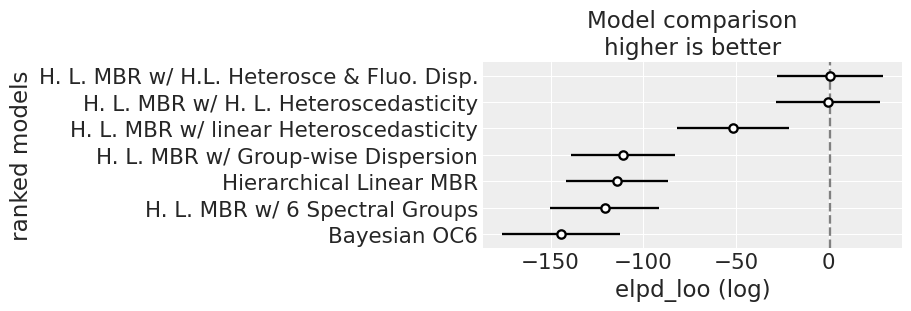

In [337]:
f_comp_loo, ax = pp.subplots(figsize=(9, 3))
az.plot_compare(compare_results, ax=ax)

### Model Comparison Using Approximate Leave-One-Out Cross-Validation (suggested for results)

We evaluated predictive performance across candidate models using approximate leave-one-out cross-validation (LOO). The best-performing model incorporated both hierarchical mean and hierarchical heteroscedastic terms, along with a measurement-type-specific dispersion adjustment for fluorescence observations. This model achieved the highest expected log predictive density (ELPD), with a 94% model weight. Notably, the inclusion of fluorescence-specific noise improved performance modestly (ELPD difference: 1.01) relative to the same model without this term. While the ELPD difference was small compared to its standard error, this variant nonetheless showed consistently improved fit without evidence of overfitting (as confirmed by effective parameter count and diagnostics). Simpler models with fixed group-wise noise or linear heteroscedasticity performed substantially worse, and classical polynomial band-ratio models such as Bayesian OC6 showed significantly reduced predictive performance.


### On the Value of Measurement-Aware Noise Modeling (suggested for discussion)

The LOO-based comparison suggests that explicitly modeling the interaction between group structure, input-dependent noise, and measurement method yields modest but consistent improvements in predictive performance. While the gain from adding fluorescence-specific noise dispersion was relatively small, it was robust and interpretable, aligning with posterior residual diagnostics. This result supports the inclusion of domain-informed noise structures in ocean color models, particularly when multiple measurement protocols contribute to training data. Future work should explore richer error structures that include lab- or investigator-specific effects, equipment-level variability, or contextual environmental conditions (e.g., CDOM, turbidity) that could differentially impact measurement precision across techniques.

 Table: Interpretation of LOO Model Comparison Metrics {#tbl-loo-interpretation}


| Metric      | Description                                                  | Interpretation                                                                                    |
| ----------- | ------------------------------------------------------------ | ------------------------------------------------------------------------------------------------- |
| `rank`      | Model ranking by LOO (higher ELPD = better)                  | Rank 0 (H.L. MBR with H.L. Heteroscedasticity + Fluo. Disp.) is the best model                    |
| `elpd_loo`  | Expected log pointwise predictive density (higher is better) | 0.74 vs -144.47 → the best model offers substantially better predictive accuracy than OC6         |
| `p_loo`     | Effective number of parameters                               | 16.27 vs 5.35 → the best model is more flexible and complex than OC6                              |
| `elpd_diff` | Difference in ELPD relative to best model                    | 0 for best, 1.01 for next-best, 145.21 for OC6 → OC6 is substantially worse                       |
| `weight`    | Model weight from LOO-based stacking (sums to 1)             | 0.77 for best model → \~77% probability that it has the best out-of-sample predictive performance |
| `se`        | Standard error of `elpd_loo`                                 | Large values (\~28–32) → modest ELPD differences should be interpreted with caution               |
| `dse`       | Standard error of `elpd_diff`                                | 2.04 between best and second-best → elpd\_diff of 1.01 is \~0.5× dse → difference is modest       |
| `warning`   | Whether LOO diagnostics flagged instability                  | `False` for all models = no evidence of problematic Pareto-k estimates or model misspecification  |
| `scale`     | The log scale is used (log predictive density)               | Correct for continuous outcome models like log(Chlorophyll)                                       |


References: